## Problem - 1

### Context
The comp-activ database comprises activity measures of computer systems. Data was gathered from a Sun Sparcstation 20/712 with 128 Mbytes of memory, operating in a multi-user university department. Users engaged in diverse tasks, such as internet access, file editing, and CPU-intensive programs.

Being an aspiring data scientist, you aim to establish a linear equation for predicting 'usr' (the percentage of time CPUs operate in user mode). Your goal is to analyze various system attributes to understand their influence on the system's 'usr' mode.

### Data Description :

System measures used:

lread - Reads (transfers per second ) between system memory and user memory

lwrite - writes (transfers per second) between system memory and user memory

scall - Number of system calls of all types per second

sread - Number of system read calls per second .

swrite - Number of system write calls per second .

fork - Number of system fork calls per second.

exec - Number of system exec calls per second.

rchar - Number of characters transferred per second by system read calls

wchar - Number of characters transfreed per second by system write calls

pgout - Number of page out requests per second

ppgout - Number of pages, paged out per second

pgfree - Number of pages per second placed on the free list.

pgscan - Number of pages checked if they can be freed per second

atch - Number of page attaches (satisfying a page fault by reclaiming a page in memory) per second

pgin - Number of page-in requests per second

ppgin - Number of pages paged in per second

pflt - Number of page faults caused by protection errors (copy-on-writes).

vflt - Number of page faults caused by address translation .

runqsz - Process run queue size (The number of kernel threads in memory that are waiting for a CPU to run.

Typically, this value should be less than 2. Consistently higher values mean that the system might be CPU-bound.)

freemem - Number of memory pages available to user processes

freeswap - Number of disk blocks available for page swapping.

usr - Portion of time (%) that cpus run in user mode

### Importing Required Libraries

In [5]:

import pandas as pd
import numpy as np

# for visualizing data
import matplotlib.pyplot as plt
import seaborn as sns

# For randomized data splitting
from sklearn.model_selection import train_test_split

# To build linear regression_model
import statsmodels.api as sm

# To check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error

from sklearn.linear_model import LinearRegression
from sklearn import metrics



In [3]:
pip install nbconvert


Note: you may need to restart the kernel to use updated packages.


## Structure of the Data

In [2]:
df = pd.read_excel("compactiv.xlsx")

In [3]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [4]:
df.tail()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.6,4.80,111111.0,22256.0,0.00,...,0.00,0.2,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [5]:
df.shape

(8192, 22)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

## Structure of the Data:
● Number of Rows: 8192

● Number of Columns: 22

● Memory Usage: 1.4+ MB

● Range Index: 0 to 8191

● Data Types: Float, Int, and Object

## Data Type:

The different datatypes in the dataset are as follows

a.There are 8 columns in the with int64 data type

b.There are 1 column in the with object data type

c.There are 13 columns in the with float64 data type

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


## Statistical Summary

Most columns in the dataset have minimum values of zero, except for "scall," "sread," "rchar," "wchar," "vflt," "freemem," and "freeswap."

All columns exhibit a positively skewed distribution, meaning the tail of the distribution extends towards the higher values, with the mean exceeding the median in each case.


## Univariate Analysis

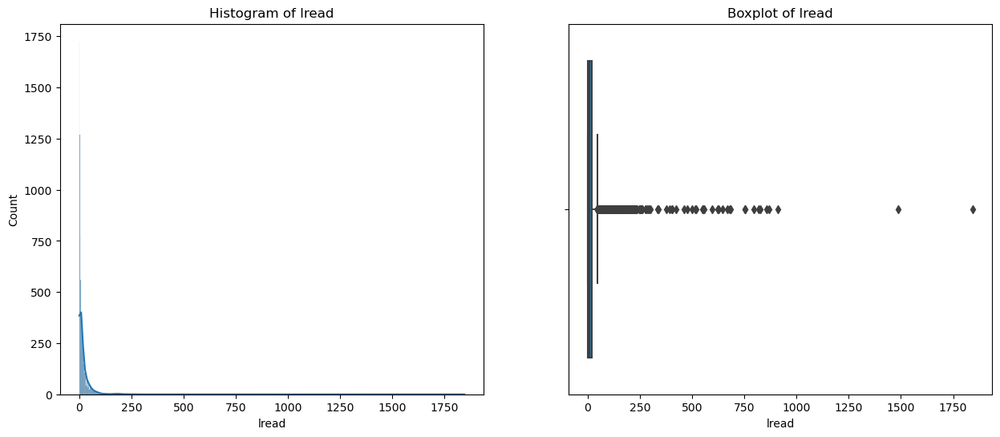

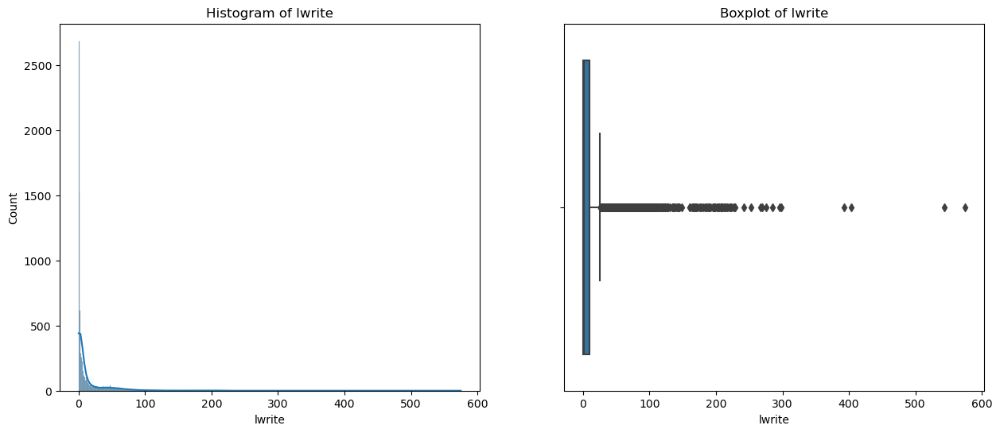

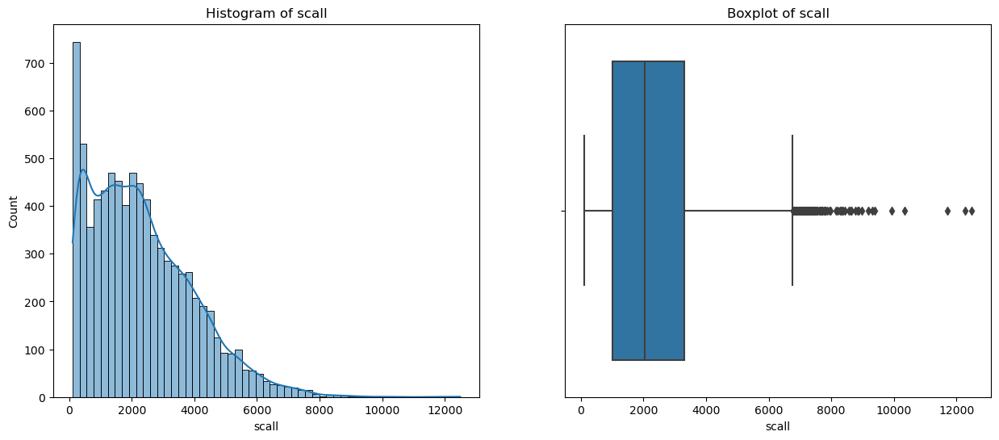

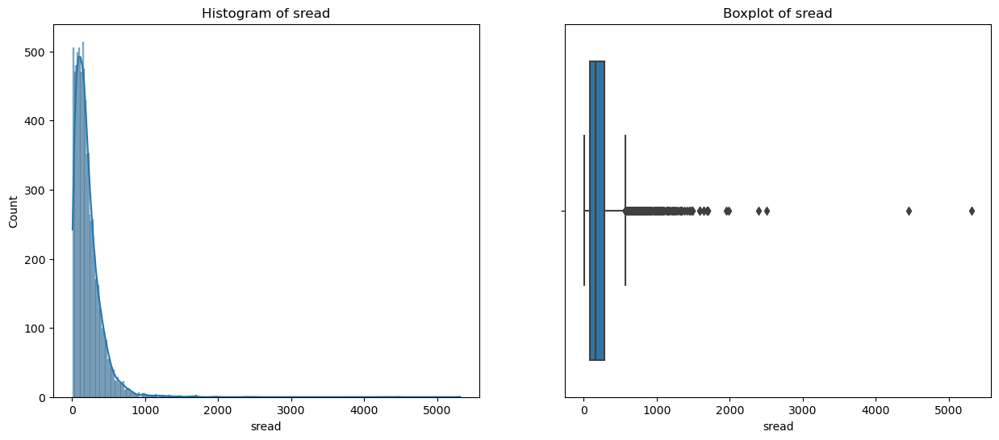

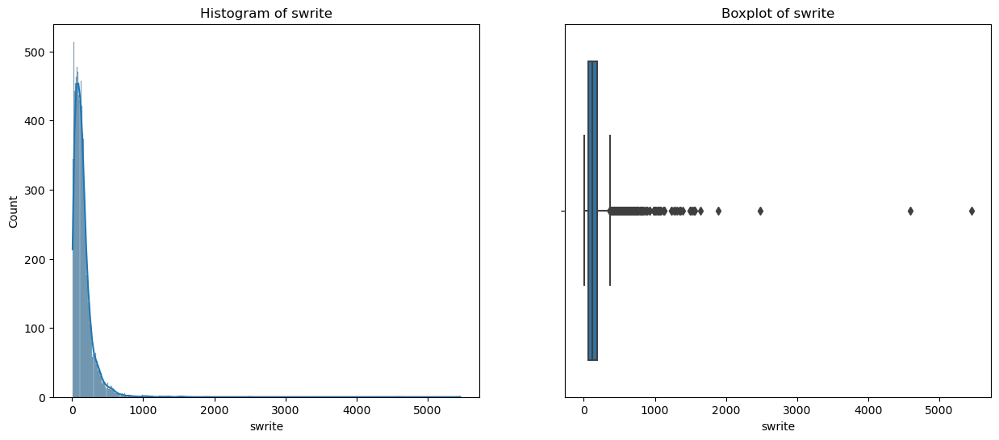

...

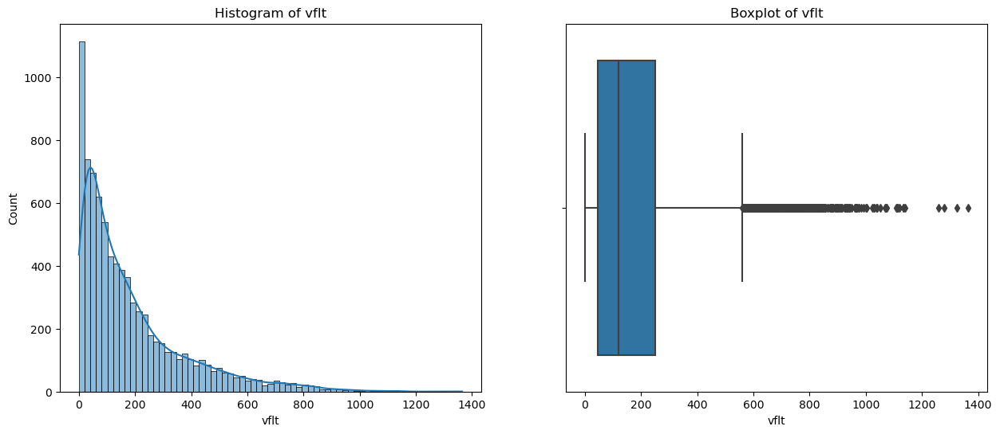

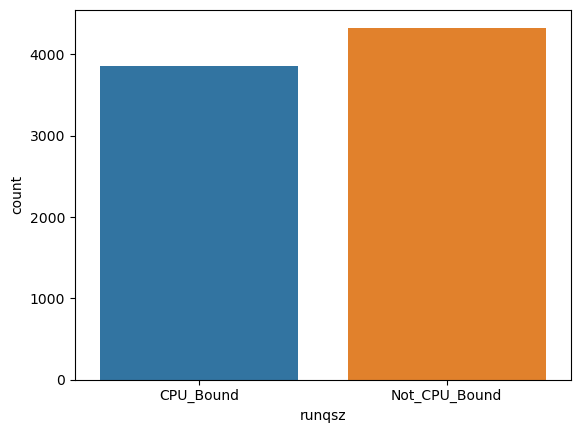

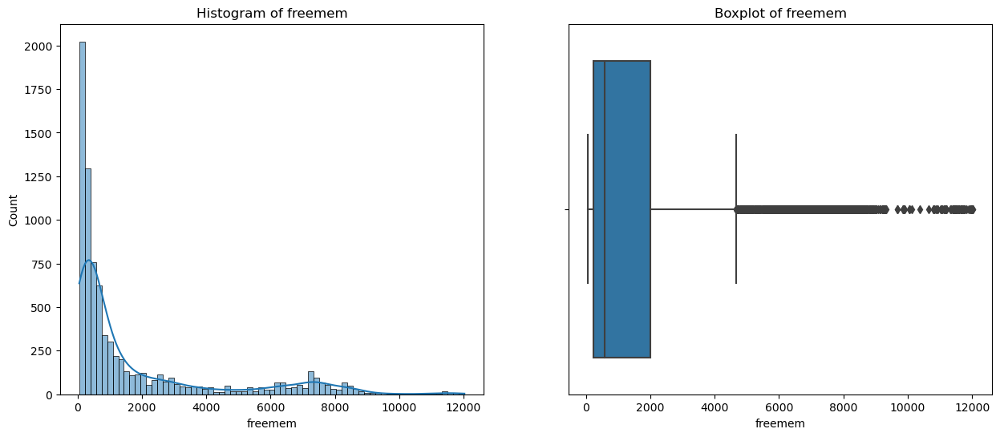

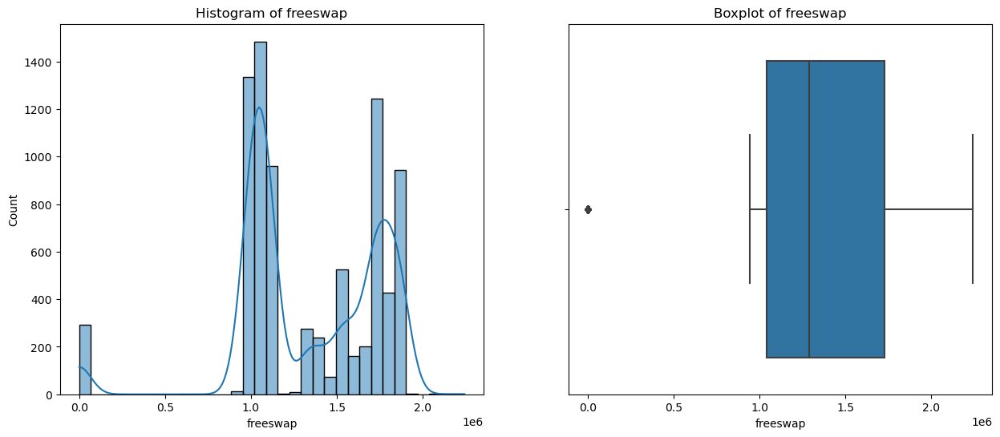

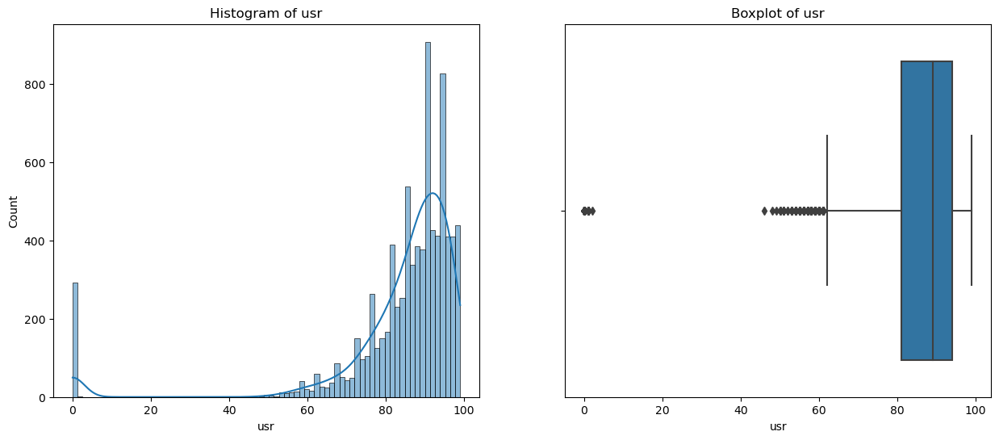

In [8]:
for col in df.columns:
    if df[col].dtype != 'object':
        fig, axes = plt.subplots(nrows=1,ncols=2)
        fig.set_size_inches(15,6)
    
        sns.histplot(data=df[col], kde=True, ax=axes[0])
        axes[0].set_title(f'Histogram of {col}')
        axes[0].set_xlabel(col)
    
        sns.boxplot(x=df[col], ax=axes[1])
        axes[1].set_title(f'Boxplot of {col}')
        axes[1].set_xlabel(col)
    
        plt.show()
    else:
        sns.countplot(x=df[col])

In [9]:
for col in df.columns:
    print(df[col].value_counts())

lread
1      1050
2       732
0       675
3       539
4       408
       ... 
223       1
254       1
141       1
117       1
129       1
Name: count, Length: 235, dtype: int64
lwrite
0      2684
1      1529
2       615
3       284
4       253
       ... 
183       1
138       1
270       1
120       1
267       1
Name: count, Length: 189, dtype: int64
scall
158     10
220     10
419      9
160      9
230      9
        ..
3362     1
4460     1
4765     1
3868     1
5180     1
Name: count, Length: 4115, dtype: int64
sread
16     43
10     41
43     40
12     38
95     37
       ..
671     1
867     1
420     1
772     1
674     1
Name: count, Length: 794, dtype: int64
swrite
30      56
91      56
24      53
118     51
22      50
        ..
599      1
732      1
419      1
1042     1
612      1
Name: count, Length: 640, dtype: int64
fork
0.20     1999
0.40      966
0.60      716
0.80      563
1.00      398
         ... 
12.38       1
1.78        1
3.56        1
0.59        1
6.37       

## Observations -

Outliers and Data Skewness:

Many columns exhibit outliers, leading to data skewness. Outliers are data points that significantly differ from other observations in the dataset. They can skew statistical measures like the mean and impact the distribution of data.
Skewed data distributions can be either positively skewed (right-skewed), where the tail of the distribution extends to the right, or negatively skewed (left-skewed), where the tail extends to the left.
Run Queue Size (runqsz):

The "runqsz" column represents the process run queue size. It indicates the number of processes waiting to run on the CPU.
Observations suggest that the dataset contains more non-CPU-bound processes, as indicated by a higher count of such observations.
This imbalance implies that there are fewer high values (possibly indicating CPU-bound processes) compared to non-CPU-bound processes in the dataset.
Highest Count for usr at 90 Percent:

Among the observations for the "usr" column, the highest count occurs at the 90th percentile, with a count of 459.
This suggests that a significant number of observations have "usr" values at or below the 90th percentile, indicating a concentration of data in the lower percentiles.
Skewness in Variables like vflt, pflt, ppgin, pgin, pgscan:

Variables such as "vflt," "pflt," "ppgin," "pgin," and "pgscan" exhibit right skewness.
Right skewness implies that the tail of the distribution extends to the right, indicating that there are fewer high values compared to lower values in the dataset.
This skewness can affect statistical analyses and modeling, as it may lead to biased estimates and influence the interpretation of results. It's important to consider transformations or other techniques to address skewness when analyzing or modeling such data.


## Bivariate and Multivariate Analysis

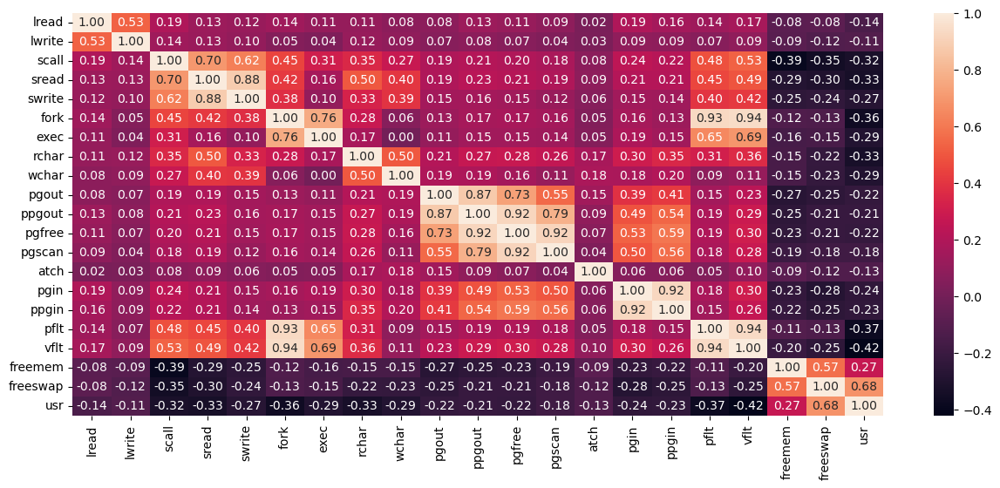

In [10]:
plt.figure(figsize=(15,6))
sns.heatmap();

C:\Users\Gagan\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


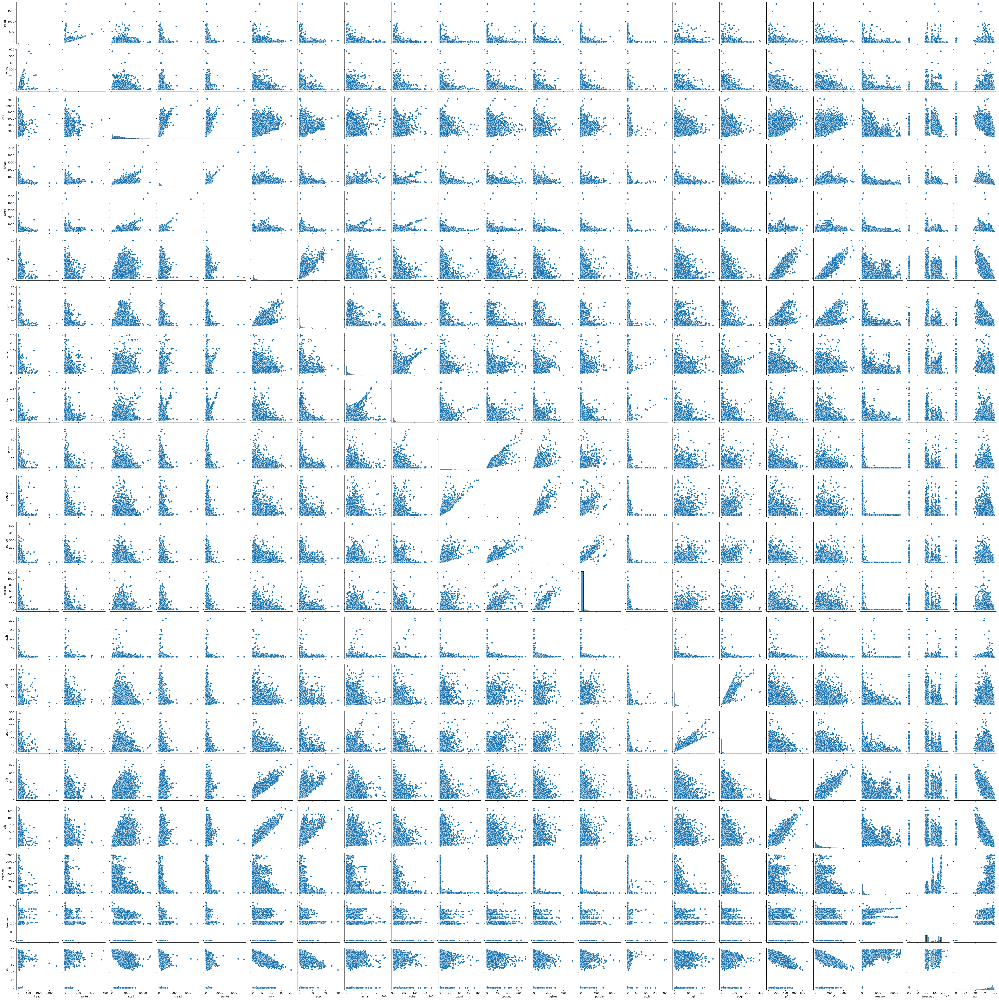

In [11]:
sns.pairplot(df)

## Observations -

Here's a summary of the key observations you've made:

High Correlation (≥ 0.9):

Variables pflt and vflt exhibit the highest correlation with fork, with correlation coefficients of 0.93 and 0.94, respectively.

Strong Correlation (≥ 0.7):

Variables scall and sread show a strong correlation of 0.70.

Moderate Correlation (0.4 - 0.59):

Several pairs of variables exhibit moderate correlation, including pgout and pgfree, pgout and pgscan, exec and fork, exec and pflt, exec and vflt, lwrite and lread, fork and scall, pflt and scall, rchar and sread, pgin and pgout, pgfree and pgin, swrite and pflt, pflt and sread, pflt and scall, vflt and swrite, vflt and sread, vflt and scall, freemem and freeswap.

Weak or No Correlation (< 0.4):

Other variables not mentioned above exhibit weak or no correlation with each other.













In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

## vflt and fork

<Axes: xlabel='vflt', ylabel='fork'>

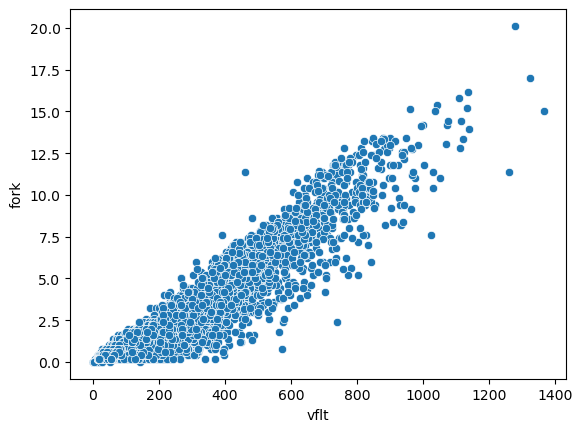

In [13]:
sns.scatterplot(x='vflt',y='fork', data=df)

## Observations:

The variables 'vflt' and 'fork' exhibit a positive correlation.

As the count of page faults (vflt) rises, there's a corresponding increase in the occurrence of system forks.

The majority of observations fall within the range of 0 to 1000 page faults (vflt), as depicted in the plot.

## pgfree and ppgout

<Axes: xlabel='pgfree', ylabel='ppgout'>

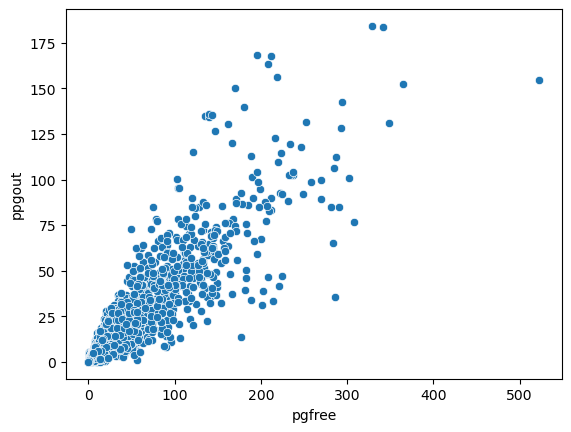

In [14]:
sns.scatterplot(x='pgfree',y='ppgout', data=df)

## Observations:

A highly notable positive correlation of 0.92 exists between the variables 'pgfree' and 'pgout'.

As the rate of pages per second being placed on the free list (pgfree) increases, there is a corresponding rise in the rate of pages being paged out per second (pgout).

The bulk of observations fall within the range of 0 to 250 for 'pgfree', as evident from the plot.

## usr and swrite

<Axes: xlabel='usr', ylabel='swrite'>

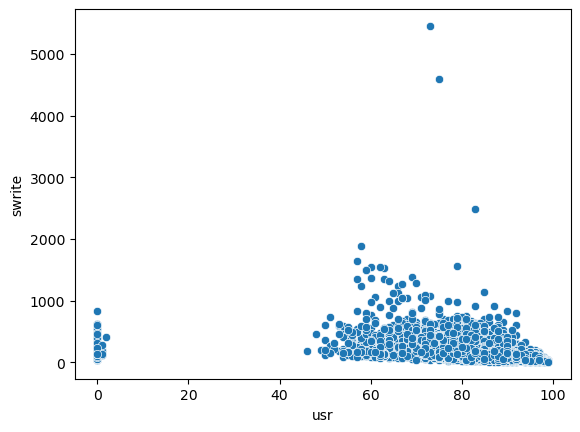

In [15]:
sns.scatterplot(x='usr',y='swrite', data=df)

Observations -

There is no significant pattern or correlation between usr and swrite.

The data reveals that the majority of observations either cluster around 0 or within the range of 40% to 100% for 'usr' (the percentage of time CPUs spend running in user mode). Interestingly, there are no observations falling within the range of 2% to 40% for 'usr'.

## usr and pflt

<Axes: xlabel='usr', ylabel='pflt'>

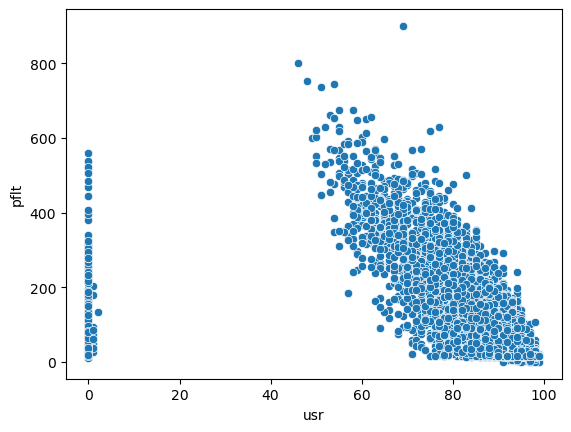

In [16]:
sns.scatterplot(x='usr',y='pflt', data=df)

## Observations -

The patterns are not clearly visible in the plot but we can see that there is a slight negative correlation between user and pflt.

The data reveals that the majority of observations either cluster around 0 or within the range of 40% to 100% for 'usr' (the percentage of time CPUs spend running in user mode). Interestingly, there are no observations falling within the range of 2% to 40% for 'usr'.

## Problem 1 - Data Pre-processing


## Missing Value Treatment (if needed)

In [17]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

### There are missing values present in rchar and wchar. To address this issue, we will impute the missing values with the median of the respective column, considering the data type is float.



In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [19]:
df['rchar'].fillna(df['rchar'].median(),inplace=True)

In [20]:
df['wchar'].fillna(df['wchar'].median(),inplace=True)

In [21]:
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

### The missing values are imputed with median as shown in the output image above.

## Outlier Treatment

<Axes: >

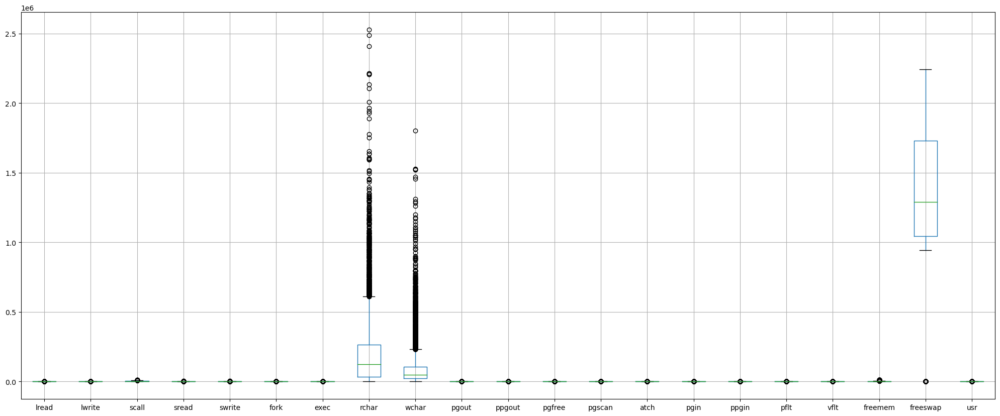

In [22]:
plt.figure(figsize=(25,10))
df.select_dtypes(include='number').boxplot()

## As can be seen, outliers are present in every variable.

In [23]:
def outliers(col):
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [24]:
for i in df.columns:
    if df[i].dtypes!='object':
        lw,uw = outliers(df[i])
        out= ((df[i] < lw) | (df[i] > uw)).sum()
        print(f' The number of outliers in {i} is {out}')
        
        df[i]= np.where(df[i]<lw, lw, df[i])
        df[i] = np.where(df[i]>uw, uw, df[i])

 The number of outliers in lread is 753
 The number of outliers in lwrite is 1305
 The number of outliers in scall is 108
 The number of outliers in sread is 340
 The number of outliers in swrite is 495
 The number of outliers in fork is 943
 The number of outliers in exec is 710
 The number of outliers in rchar is 465
 The number of outliers in wchar is 817
 The number of outliers in pgout is 988
 The number of outliers in ppgout is 1315
 The number of outliers in pgfree is 1555
 The number of outliers in pgscan is 1744
 The number of outliers in atch is 1209
 The number of outliers in pgin is 789
 The number of outliers in ppgin is 821
 The number of outliers in pflt is 395
 The number of outliers in vflt is 484
 The number of outliers in freemem is 1185
 The number of outliers in freeswap is 294
 The number of outliers in usr is 430


<Axes: >

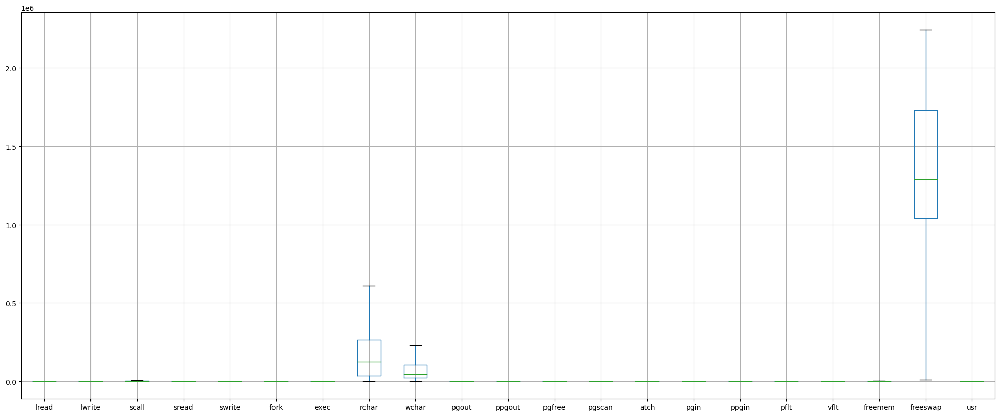

In [25]:
plt.figure(figsize=(25,10))
df.select_dtypes(include='number').boxplot()

### The outliers have been addressed for all the variables.

# Feature Engineering

In [26]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4659.125,1730946.0,95.0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,4659.125,1869002.0,97.0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702.000,1021237.0,87.0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,4659.125,1863704.0,98.0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633.000,1760253.0,90.0


### Converting Instant_bookable from 'Not_CPU_Bound' and 'CPU_Bound' to boolean

In [27]:
df['runqsz'].replace(['Not_CPU_Bound','CPU_Bound'],[False,True],inplace=True )

In [28]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,True,4659.125,1730946.0,95.0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,False,4659.125,1869002.0,97.0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,False,702.000,1021237.0,87.0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,False,4659.125,1863704.0,98.0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,False,633.000,1760253.0,90.0



### In the "runqsz" column, instances labeled as "Not_CPU_Bound" have been substituted with the value False, while instances labeled as "CPU_Bound" have been substituted with the value True.

# Encode the data

In [29]:
df = pd.get_dummies(df, columns=['runqsz'], drop_first=True, dtype=int)

In [30]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_True
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,95.0,1
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,97.0,0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,87.0,0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,98.0,0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,90.0,0


### The encoding process has been completed successfully. Now, we have a new column called runqsz_True, where the values 1 and 0 correspond to true or false, indicating whether the process is CPU-bound or not CPU-bound, respectively.

# Checking for duplicates

In [31]:
# Are there any duplicates ?
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


### Since there are no duplicate entries in the dataset, there's no need for us to remove any records.

# Train-test split

In [32]:
# Copy all the predictor variables into X dataframe
X = df.drop('usr', axis=1)

# Copy target into the y dataframe. 
y = df[['usr']]

In [33]:
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_True
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,1
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,0.0,0.0,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,0


### We proceed with splitting the dataset into training and testing sets. X contains all the predictor variables, while y comprises the 'usr' variable, which serves as our target variable. As indicated in the preceding output, the data has been split successfully.

In [34]:
# Split X and y into training and test set in 75:25 ratio
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25 , random_state=1)

## Problem 1- Model Building - Linear regression

### Linear Regression Model(using OLS)

In [35]:
# invoke the LinearRegression function and find the bestfit model on training data

import statsmodels.api as sm

In [36]:
X_train = X_train.astype(float)
y_train = y_train.astype(float)

In [37]:
X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)

In [38]:
#Let us build the model 
model = sm.OLS(y_train,X_train).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1183.
Date:                Fri, 19 Apr 2024   Prob (F-statistic):               0.00
Time:                        21:13:06   Log-Likelihood:                -17870.
No. Observations:                6144   AIC:                         3.578e+04
Df Residuals:                    6123   BIC:                         3.592e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          85.6549      0.286    299.223      

### Given our current R-squared value of 79.4, our next step is to investigate multicollinearity and eliminate any variables contributing to it in an effort to boost the R-squared value.

### Lets take a look at the VIF values of the predictors -

In [39]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const          25.505365
lread           5.329904
lwrite          4.321098
scall           2.960670
sread           6.411855
swrite          5.597305
fork           13.007090
exec            3.200317
rchar           2.122906
wchar           1.595891
pgout          11.240801
ppgout         29.300444
pgfree         16.538594
pgscan               NaN
atch            1.873416
pgin           13.824074
ppgin          13.987579
pflt           11.958409
vflt           15.573372
freemem         1.958029
freeswap        1.837506
runqsz_True     1.156618
dtype: float64



C:\Users\Gagan\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1781: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


### AS few predictors have VIF values > 2 therefore there is some multicolinearity in the data 

#### <font color='red'><i>We remove those predictors with multicolinarity due to which there is least impact on the adjusted R2 </i></font>

In [40]:
X_train.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin',
       'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_True'],
      dtype='object')

### 1) Initially, we'll exclude the variable "fork" due to its VIF value exceeding 10.

In [41]:
X_train2 = X_train.drop(["fork"], axis=1)
olsmod_1 = sm.OLS(y_train, X_train2)
olsres_1 = olsmod_1.fit()
print(
    "R-squared(fork):",
    np.round(olsres_1.rsquared, 3),
    "\nAdjusted R-squared(fork):",
    np.round(olsres_1.rsquared_adj, 3),
)

R-squared(fork): 0.794 
Adjusted R-squared(fork): 0.794


In [42]:
0.794-0.794
# As no effect on the adjusted R2 we can choose to drop it 

0.0

### 2) Removing predictor 'pgout' as VIF>10

In [43]:
X_train3 = X_train.drop(["pgout"], axis=1)
olsmod_2 = sm.OLS(y_train, X_train3)
olsres_2 = olsmod_2.fit()
print(
    "R-squared(pgout):",
    np.round(olsres_2.rsquared, 3),
    "\nAdjusted R-squared(pgout):",
    np.round(olsres_2.rsquared_adj, 3),
)

R-squared(pgout): 0.794 
Adjusted R-squared(pgout): 0.793


In [44]:
0.794-0.794
# As no effect on the adjusted R2 we can choose to drop it 

0.0

### 3) Removing predictor 'pgfree' as VIF>10

In [45]:
X_train4 = X_train.drop(["pgfree"], axis=1)
olsmod_3 = sm.OLS(y_train, X_train4)
olsres_3 = olsmod_3.fit()
print(
    "R-squared(pgfree):",
    np.round(olsres_3.rsquared, 3),
    "\nAdjusted R-squared(pgfree):",
    np.round(olsres_3.rsquared_adj, 3),
)

R-squared(pgfree): 0.794 
Adjusted R-squared(pgfree): 0.794


In [46]:
0.794-0.794
# As no effect on the adjusted R2 we can choose to drop it 

0.0

### 4) Removing predictor 'ppgout' as VIF>10

In [47]:
X_train5 = X_train.drop(["ppgout"], axis=1)
olsmod_4 = sm.OLS(y_train, X_train5)
olsres_4 = olsmod_4.fit()
print(
    "R-squared(ppgout):",
    np.round(olsres_4.rsquared, 3),
    "\nAdjusted R-squared(ppgout):",
    np.round(olsres_4.rsquared_adj, 3),
)

R-squared(ppgout): 0.794 
Adjusted R-squared(ppgout): 0.794


In [48]:
0.794-0.794
# As no effect on the adjusted R2 we can choose to drop it 

0.0

### 5) Removing predictor 'pgin' as VIF>10

In [49]:
X_train6 = X_train.drop(["pgin"], axis=1)
olsmod_5 = sm.OLS(y_train, X_train6)
olsres_5 = olsmod_1.fit()
print(
    "R-squared(pgin):",
    np.round(olsres_5.rsquared, 3),
    "\nAdjusted R-squared(pgin):",
    np.round(olsres_5.rsquared_adj, 3),
)

R-squared(pgin): 0.794 
Adjusted R-squared(pgin): 0.794


In [50]:
0.794-0.794
# As no effect on the adjusted R2 we can choose to drop it 

0.0

### 6) Removing predictor 'ppgin' as VIF>10

In [51]:
# Dropping 'ppgin' variable
X_train_7 = X_train.drop(["ppgin"], axis=1)
olsmod_6 = sm.OLS(y_train, X_train_7)
olsres_6 = olsmod_6.fit()
print(
    "R-squared(ppgin):",
    np.round(olsres_6.rsquared, 3),
    "\nAdjusted R-squared(ppgin):",
    np.round(olsres_6.rsquared_adj, 3),
)

R-squared(ppgin): 0.794 
Adjusted R-squared(ppgin): 0.793


In [52]:
0.794-0.794
# As no effect on the adjusted R2 we can choose to drop it 

0.0

### 7) Removing predictor 'pflt' as VIF>10

In [53]:
# Dropping 'pflt' variable
X_train_8 = X_train.drop(["pflt"], axis=1)
olsmod_7= sm.OLS(y_train, X_train_8)
olsres_7 = olsmod_7.fit()
print(
    "R-squared(pflt):",
    np.round(olsres_7.rsquared, 3),
    "\nAdjusted R-squared(pflt):",
    np.round(olsres_7.rsquared_adj, 3),
)

R-squared(pflt): 0.784 
Adjusted R-squared(pflt): 0.783


In [54]:
0.794-0.784
# As there is small effect on the adjusted R2 we can choose to drop it 

0.010000000000000009

### 8) Removing predictor 'vflt' as VIF>10

In [55]:
# Dropping 'vflt' variable
X_train_9 = X_train.drop(["vflt"], axis=1)
olsmod_8 = sm.OLS(y_train, X_train_9)
olsres_8 = olsmod_8.fit()
print(
    "R-squared(vflt):",
    np.round(olsres_8.rsquared, 3),
    "\nAdjusted R-squared(vflt):",
    np.round(olsres_8.rsquared_adj, 3),
)

R-squared(vflt): 0.794 
Adjusted R-squared(vflt): 0.793


In [56]:
0.794-0.794
# As there is small effect on the adjusted R2 we can choose to drop it 

0.0

### Observations: 
    
### It appears that for most predictor variables with a VIF greater than 10, their individual R-squared values are comparable to the overall model's R-squared. This suggests that removing these variables may have minimal to no impact on the model's explanatory power. In other words, dropping these variables is unlikely to substantially affect the model's performance.

### Dropping all of these variables now

In [57]:
X_train_10 = X_train.drop(['fork','pgout','pgfree','ppgout','ppgin','pflt','vflt'], axis=1)

In [58]:
olsmod_9 = sm.OLS(y_train, X_train_10)
olsres_9 = olsmod_9.fit()
print(
    "R-squared:",
    np.round(olsres_9.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_9.rsquared_adj, 3),
)


R-squared: 0.739 
Adjusted R-squared: 0.738


### let's check the VIF of the predictors after removing these variables


In [59]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const          25.505365
lread           5.329904
lwrite          4.321098
scall           2.960670
sread           6.411855
swrite          5.597305
fork           13.007090
exec            3.200317
rchar           2.122906
wchar           1.595891
pgout          11.240801
ppgout         29.300444
pgfree         16.538594
pgscan               NaN
atch            1.873416
pgin           13.824074
ppgin          13.987579
pflt           11.958409
vflt           15.573372
freemem         1.958029
freeswap        1.837506
runqsz_True     1.156618
dtype: float64



C:\Users\Gagan\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1781: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


### Now that we do not have multicollinearity in our data, the p-values of the coefficients have become reliable and we can remove the non-significant predictor variables.

In [60]:
print(olsres_9.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.739
Model:                            OLS   Adj. R-squared:                  0.738
Method:                 Least Squares   F-statistic:                     1334.
Date:                Fri, 19 Apr 2024   Prob (F-statistic):               0.00
Time:                        21:13:07   Log-Likelihood:                -18605.
No. Observations:                6144   AIC:                         3.724e+04
Df Residuals:                    6130   BIC:                         3.733e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          86.5003      0.316    273.844      

### Now as observed from above the predictors, 'wchar' and 'atch' has p-value>0.05 we remove that and build the model 

In [61]:
X_train10 = X_train.drop(['wchar','atch'], axis=1)
olsmod_10= sm.OLS(y_train, X_train6)
olsres_10 = olsmod_10.fit()
print(olsres_10.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1245.
Date:                Fri, 19 Apr 2024   Prob (F-statistic):               0.00
Time:                        21:13:07   Log-Likelihood:                -17870.
No. Observations:                6144   AIC:                         3.578e+04
Df Residuals:                    6124   BIC:                         3.592e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          85.6739      0.285    300.247      

### **After dropping the features causing strong multicollinearity and the statistically insignificant ones, our model performance hasn't dropped sharply . This shows that these variables did not have much predictive power.**

### Testing the Assumptions of Linear Regression 

#### For Linear Regression, we need to check if the following assumptions hold:-

1. Linearity 
2. Independence 
3. Homoscedasticity
4. Normality of error terms
5. No strong Multicollinearity

#### Linearity and Independence of predictors 

In [62]:
df_pred = pd.DataFrame()

df_pred['Actual Values']= y_train.values.flatten()
df_pred['Fitted Values']= olsres_6.fittedvalues.values
df_pred['Residuals']= olsres_6.resid.values
df_pred.head()

,Actual Values,Fitted Values,Residuals
0,94.0,89.752157,4.247843
1,96.0,88.171298,7.828702
2,77.0,77.616803,-0.616803
3,93.0,97.890175,-4.890175
4,86.0,86.561922,-0.561922


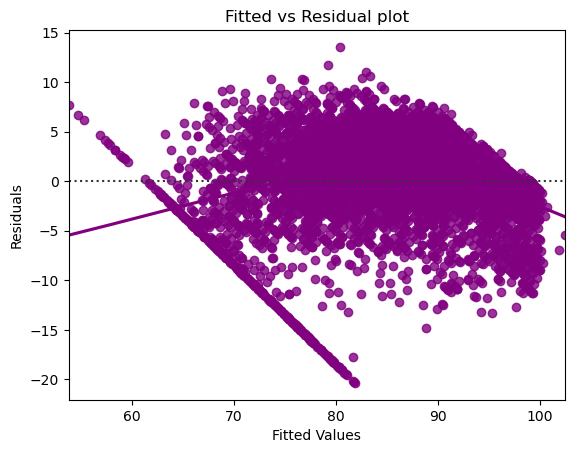

In [63]:
# let us plot the fitted values vs residuals
sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

### There is no significant pattern

#### Test for Normality 

In [64]:
from scipy import stats

In [65]:
stats.shapiro(df_pred["Residuals"])

C:\Users\Gagan\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9399019479751587, pvalue=2.1019476964872256e-44)

#### Test for Homoscedasticity

In [66]:
import statsmodels.stats.api as sms

In [67]:
sms.het_goldfeldquandt(df_pred["Residuals"], X_train6)[1]

0.012154361139571362

### The model built olsmod_6 satisfies all assumptions of Linear Regression 

In [68]:
olsres_6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.793
Method:                 Least Squares   F-statistic:                     1242.
Date:                Fri, 19 Apr 2024   Prob (F-statistic):               0.00
Time:                        21:13:12   Log-Likelihood:                -17877.
No. Observations:                6144   AIC:                         3.579e+04
Df Residuals:                    6124   BIC:                         3.593e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          85.6898      0.286    299.182      0.000      85.128      86.251
lread          -0.0668      0.009     -7.713      0.000      -0.084      -0.050
lwrite          0.0508      0.013      4.004      0.000       0.026       0.076
scall          -0.0007    6.1e-05    -11.047      0.000      -0.001      -0.001
sread           0.0006      0.001      0.583      0.560      -0.001       0.002
swrite         -0.0056      0.001     -4.028      0.000      -0.008      -0.003
fork            0.0535      0.128      0.419      0.675      -0.197       0.304
exec           -0.3028      0.050     -6.069      0.000      -0.401      -0.205
rchar       -5.393e-06   4.69e-07    -11.496      0.000   -6.31e-06   -4.47e-06
wchar       -5.306e-06   1.01e-06     -5.272      0.000   -7.28e-06   -3.33e-06
pgout          -0.4010      0.087     -4.623      0.000      -0.571      -0.231
ppgout         -0.0414      0.076     -0.543      0.587      -0.191       0.108
pgfree          0.0609      0.046      1.311      0.190      -0.030       0.152
pgscan      -1.561e-14   7.39e-17   -211.122      0.000   -1.58e-14   -1.55e-14
atch            0.6629      0.139      4.783      0.000       0.391       0.935
pgin           -0.0736      0.010     -7.567      0.000      -0.093      -0.055
pflt           -0.0337      0.002    -17.546      0.000      -0.037      -0.030
vflt           -0.0055      0.001     -4.005      0.000      -0.008      -0.003
freemem        -0.0005   4.94e-05     -9.589      0.000      -0.001      -0.000
freeswap     8.871e-06   1.84e-07     48.280      0.000    8.51e-06    9.23e-06
runqsz_True    -1.6220      0.122    -13.275      0.000      -1.862      -1.382
==============================================================================
Omnibus:                     1149.712   Durbin-Watson:                   2.015
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2402.792
Skew:                          -1.103   Prob(JB):                         0.00
Kurtosis:                       5.127   Cond. No.                     5.16e+22
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 4.58e-30. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

#### The model equation will be as follows:

In [69]:
# Let us write the equation of linear regression
Equation = "usr ="
print(Equation, end=" ")
for i in range(len(X_train_10.columns)):
    if i == 0:
        print(olsres_9.params[i], "+", end=" ")
    elif i != len(X_train_10.columns) - 1:
        print(
            olsres_9.params[i],
            "* (",
            X_train_10.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(olsres_9.params[i], "* (", X_train_10.columns[i], ")")

usr = 86.50033823675241 + -0.14806765525164184 * ( lread ) +  0.15727702982106334 * ( lwrite ) +  -0.000478830255032549 * ( scall ) +  -0.0029127025131697806 * ( sread ) +  -0.018149980926498173 * ( swrite ) +  -1.5559973118441364 * ( exec ) +  -7.443259987671406e-06 * ( rchar ) +  1.5095931737171688e-06 * ( wchar ) +  1.578219677698472e-13 * ( pgscan ) +  -0.05403060711564556 * ( atch ) +  -0.08238648737961496 * ( pgin ) +  -0.0005440167919623178 * ( freemem ) +  8.259861605713757e-06 * ( freeswap ) +  -1.324707901823066 * ( runqsz_True )


### Observation

* For every 1 unit increase in lread (reads per second between system memory and user memory), the usr decreases by a factor of   -0.149.
* For every 1 unit increase in lwrite (writes per second between system memory and user memory), the usr increases by a factor     of 0.159.
* For every 1 unit increase in scall (system calls of all types per second), the usr decreases by a factor of 0.000478.
* For every 1 unit increase in sread (system read calls per second), the usr decreases by a factor of 0.00307.
* For every 1 unit increase in swrite (system write calls per second), the usr decreases by a factor of 0.0177.
* For every 1 unit increase in exec (system exec calls per second), the usr decreases by a factor of 1.561.
* For every 1 unit increase in rchar (characters transferred per second by system read calls), the usr decreases by a factor of   approximately 7.21e-06.
* For every 1 unit increase in pgin (page-in requests per second), the usr decreases by a factor of 0.082.
* For every 1 unit increase in freemem (memory pages available to user processes), the usr decreases by a factor of 0.000537.
* For every 1 unit increase in freeswap (disk blocks available for page swapping), the usr increases by a factor of               approximately 8.26e-06.
* If the property has a run queue size (runqsz), the usr decreases by a factor of 1.29.

In [70]:
df

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_True
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.20,40671.0,53995.0,0.0,...,0.0,0.0,1.6000,2.60,16.00,26.40,4659.125,1730946.0,95.0,1
1,0.0,0.0,170.0,18.0,21.0,0.2,0.20,448.0,8385.0,0.0,...,0.0,0.0,0.0000,0.00,15.63,16.83,4659.125,1869002.0,97.0,0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.40,125473.5,31950.0,0.0,...,0.0,1.2,6.0000,9.40,150.20,220.20,702.000,1021237.0,87.0,0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.20,125473.5,8670.0,0.0,...,0.0,0.0,0.2000,0.20,15.60,16.80,4659.125,1863704.0,98.0,0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.40,125473.5,12185.0,0.0,...,0.0,0.0,1.0000,1.20,37.80,47.60,633.000,1760253.0,90.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16.0,12.0,3009.0,360.0,244.0,1.6,5.81,405250.0,85282.0,6.0,...,0.0,0.6,23.5125,33.60,139.28,270.74,387.000,986647.0,80.0,1
8188,4.0,0.0,1596.0,170.0,146.0,2.4,1.80,89489.0,41764.0,3.8,...,0.0,0.8,3.8000,4.40,122.40,212.60,263.000,1055742.0,90.0,0
8189,16.0,5.0,3116.0,289.0,190.0,0.6,0.60,325948.0,52640.0,0.4,...,0.0,0.4,23.5125,33.60,60.20,219.80,400.000,969106.0,87.0,0
8190,32.0,25.0,5180.0,254.0,179.0,1.2,1.20,62571.0,29505.0,1.4,...,0.0,0.4,23.0500,24.25,93.19,202.81,141.000,1022458.0,83.0,1


In [71]:
df.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'usr', 'runqsz_True'],
      dtype='object')

### Predictions 

In [92]:
X_train_10.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'exec', 'rchar',
       'wchar', 'pgscan', 'atch', 'pgin', 'freemem', 'freeswap',
       'runqsz_True'],
      dtype='object')

In [93]:
X_test.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin',
       'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_True'],
      dtype='object')

In [94]:
# dropping columns from the test data that are not there in the training data
X_test2 = X_test.drop(
    ['fork','pgout','pgfree','ppgout','ppgin','pflt','vflt'], axis=1
)

In [97]:
# let's make predictions on the test set
y_pred_test = olsres_9.predict(X_test2)
y_pred_train = olsres_9.predict(X_train_10)

In [98]:
# To check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [99]:
# let's check the RMSE on the train data
rmse1 = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse1

4.998761093503711

In [100]:
# let's check the RMSE on the test data
rmse2 = np.sqrt(mean_squared_error(y_test, y_pred_test))
rmse2

5.23218971637551

## Observations - 

* Columns not present in the training data are dropped from the test data to maintain feature consistency.
* Model performance is assessed using root mean squared error (RMSE) on both the training and test datasets.
* The RMSE value for the training data is approximately 4.99.
* The RMSE value for the test data is approximately 5.23.


# Linear Regression using (sklearn)

In [103]:
# invoke the LinearRegression function and find the bestfit model on training data

regression_model = LinearRegression()
regression_model.fit(X_train_10, y_train)

LinearRegression()

## Linear Regression model has been created

# Let us explore the coefficients for each of the independent attributes


In [107]:
for idx, col_name in enumerate(X_train_10.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for const is 0.0
The coefficient for lread is -0.14806765525157983
The coefficient for lwrite is 0.15727702982092817
The coefficient for scall is -0.00047883025503225635
The coefficient for sread is -0.0029127025131867874
The coefficient for swrite is -0.018149980926494926
The coefficient for exec is -1.5559973118434975
The coefficient for rchar is -7.443259987617579e-06
The coefficient for wchar is 1.5095931736649332e-06
The coefficient for pgscan is 6.661338147750939e-16
The coefficient for atch is -0.054030607118203455
The coefficient for pgin is -0.08238648737968349
The coefficient for freemem is -0.0005440167919655747
The coefficient for freeswap is 8.259861605658392e-06
The coefficient for runqsz_True is -1.3247079018233419


### Let us check the intercept for the model

In [109]:
intercept = regression_model.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 86.50033823687217


### R square on training data

In [111]:
regression_model.score(X_train_10, y_train)

0.7388207780955344

## 73% of the variation in the 'usr' is explained by the predictors in the model for train set

### RMSE on Training data

In [114]:
predicted_train=regression_model.fit(X_train_10, y_train).predict(X_train_10)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

4.9987610935037115

### RMSE on Testing data

In [116]:
predicted_test=regression_model.fit(X_train_10, y_train).predict(X_test2)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

5.232189716374651

## When comparing the RMSE values computed using Statsmodels and Sklearn on both the training and testing data, it can be observed that they are identical. Specifically, the RMSE value for the training data is 4.99, while for the testing data, it is 5.23.

## Impact of Relevant Variables:
### lread (Reads) and lwrite (Writes): These variables have positive coefficients, indicating that an increase in transfers per second between system memory and user memory is associated with a higher outcome value. This suggests that optimizing memory read and write operations can lead to improved system performance.

### exec (Executions): With a negative coefficient, an increase in the number of system exec calls per second is associated with a decrease in the outcome. This implies that excessive execution of system processes may have a detrimental effect on overall system performance.

## Key Takeaways:
### Optimize Memory Operations: Given the positive impact of memory read and write operations on the outcome, focusing on optimizing these operations can lead to better system performance. This might involve improving memory management algorithms or enhancing hardware capabilities related to memory transfers.

### Monitor and Control System Executions: Since a higher frequency of system exec calls has a negative impact on the outcome, it's essential to monitor and control the number of such executions. This could involve optimizing system processes, reducing unnecessary executions, or implementing efficient scheduling algorithms.

### Resource Allocation: Considering the impact of variables related to memory utilization and system executions, it's crucial to allocate system resources effectively. Balancing resource allocation between memory-intensive tasks and system processes can help optimize overall system performance.

### Proactive System Monitoring: Continuous monitoring of system performance metrics such as memory utilization, system calls, and run queue size is vital. This allows for early detection of performance bottlenecks or resource constraints, enabling proactive measures to maintain system efficiency.

### Further Investigation: While the provided equation sheds light on the impact of various variables, further investigation may be necessary to understand the complex interactions and dependencies within the system. This could involve conducting additional experiments, analyzing historical data trends, or exploring advanced modeling techniques.

### By incorporating these insights into system management practices, businesses can enhance the efficiency and reliability of their systems, ultimately improving user experience and operational effectiveness.

# Problem - 2
Objective
In your role as a statistician at the Republic of Indonesia Ministry of Health, you have been entrusted with a dataset containing information from a Contraceptive Prevalence Survey. This dataset encompasses data from 1473 married females who were either not pregnant or were uncertain of their pregnancy status during the survey.

Your task involves predicting whether these women opt for a contraceptive method of choice. This prediction will be based on a comprehensive analysis of their demographic and socio-economic attributes.

## Data Description
1. Wife's age (numerical)
2. Wife's education (categorical) 1=uneducated, 2, 3, 4=tertiary
3. Husband's education (categorical) 1=uneducated, 2, 3, 4=tertiary
4. Number of children ever born (numerical)
5. Wife's religion (binary) Non-Scientology, Scientology
6. Wife's now working? (binary) Yes, No
7. Husband's occupation (categorical) 1, 2, 3, 4(random)
8. Standard-of-living index (categorical) 1=verlow, 2, 3, 4=high
9. Media exposure (binary) Good, Not good
10. Contraceptive method used (class attribute) No,Yes

In [76]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [ ]:
Contraceptive_method_dataset.xlsx

In [86]:
cmd=pd.read_excel('Contraceptive_method_dataset.xlsx')

# Data Structure

In [87]:
cmd.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [88]:
cmd.tail()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1468,33.0,Tertiary,Tertiary,NaN,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,NaN,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,NaN,Scientology,Yes,2,Low,Exposed,Yes
1472,17.0,Secondary,Secondary,1.0,Scientology,No,2,Very High,Exposed,Yes


In [89]:
# To print number of rows and columns present in the dataset
print("no.of rows: ",cmd.shape[0], "no.of columns:",cmd.shape[1])

no.of rows:  1473 no.of columns: 10


In [90]:
# To view the shape of the dataset
cmd.shape


(1473, 10)

In [91]:
cmd.info()# To Check for null values in the datasetcmd.isnull().sum()# To Check the dulipciate values in the datasetcmd.duplicated().sum()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [92]:
# To Check for null values in the dataset
cmd.isnull().sum()

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [93]:
# To Check the dulipciate values in the dataset
cmd.duplicated().sum()

80

In [94]:
# To Check for duplicate values in the dataset
dups = cmd.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
cmd[dups]

Number of duplicate rows = 80


,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
79,38.0,Tertiary,Tertiary,1.0,Scientology,Yes,1,Very High,Exposed,No
167,26.0,Tertiary,Tertiary,1.0,Scientology,No,1,Very High,Exposed,No
224,47.0,Tertiary,Tertiary,4.0,Scientology,No,1,Very High,Exposed,No
270,30.0,Tertiary,Tertiary,2.0,Scientology,No,1,Very High,Exposed,No
299,26.0,Tertiary,Tertiary,1.0,Scientology,No,1,Very High,Exposed,No
...,...,...,...,...,...,...,...,...,...,...
1367,44.0,Tertiary,Tertiary,5.0,Scientology,Yes,1,Very High,Exposed,Yes
1387,NaN,Secondary,Tertiary,2.0,Scientology,Yes,2,Very High,Exposed,Yes
1423,NaN,Tertiary,Tertiary,2.0,Non-Scientology,No,1,Very High,Exposed,Yes
1440,NaN,Tertiary,Tertiary,1.0,Non-Scientology,Yes,2,Very High,Exposed,Yes


# Observations 

In [95]:
# Removing the duplicate value
cmd.drop_duplicates(inplace=True)

In [96]:
# To Check for duplicate values after drop in the dataset
# To Check for duplicate values in the dataset
dups = cmd.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
cmd[dups]

Number of duplicate rows = 0


,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used


## Duplicate rows has been taken care of

In [97]:
# To print number of rows and columns present in the dataset after removing the
print("no.of rows: ",cmd.shape[0], "no.of columns:",cmd.shape[1])

no.of rows:  1393 no.of columns: 10


In [98]:
# To view describe the dataset
cmd.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1326.0,32.557315,8.289259,16.0,26.0,32.0,39.0,49.0
No_of_children_born,1372.0,3.290816,2.399697,0.0,1.0,3.0,5.0,16.0
Husband_Occupation,1393.0,2.174444,0.854590,1.0,1.0,2.0,3.0,4.0


In [99]:
# To Check for null values in the dataset
cmd.isnull().sum()

Wife_age                     67
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [100]:
cmd.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1326.0,32.557315,8.289259,16.0,26.0,32.0,39.0,49.0
No_of_children_born,1372.0,3.290816,2.399697,0.0,1.0,3.0,5.0,16.0
Husband_Occupation,1393.0,2.174444,0.854590,1.0,1.0,2.0,3.0,4.0


# Insight:

## Outlier Treatment

## To check for outliers, we will be plotting the box plots.

In [101]:
cmd_num= cmd.select_dtypes(include= ['float64', 'int64'])

C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\254540260.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()# Define a function which results the upper and lower limit to detect outliersdef remove_outlier(col): Q1,Q3=col.quantile([0.25,0.75]) IQR=Q3-Q1 lower_range= Q1-(1.5 * IQR) upper_range= Q3+(1.5 * IQR) return lower_range, upper_range# Cap & floor the values beyond the outlier boundariesfor iin feature_list: LL,UL= remove_outlier(cmd_num[i]) cmd_num[i] = np.where(cmd_num[i] > UL,UL, cmd_num[i]) cmd_num[i] = np.where(cmd_num[i] < LL,LL, cmd_num[i])# Check the presence of outliers in the each featuresplt.figure(figsize=(12,8))feature_list= cmd_num.columns
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\254540260.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()# Define a function which results the upper and lower limit to detect outliersdef remove_outlier(col): Q1,Q3=col.quantile([0.25,0.75]) IQR=Q3-Q1 lower_range= Q1-(1.5 

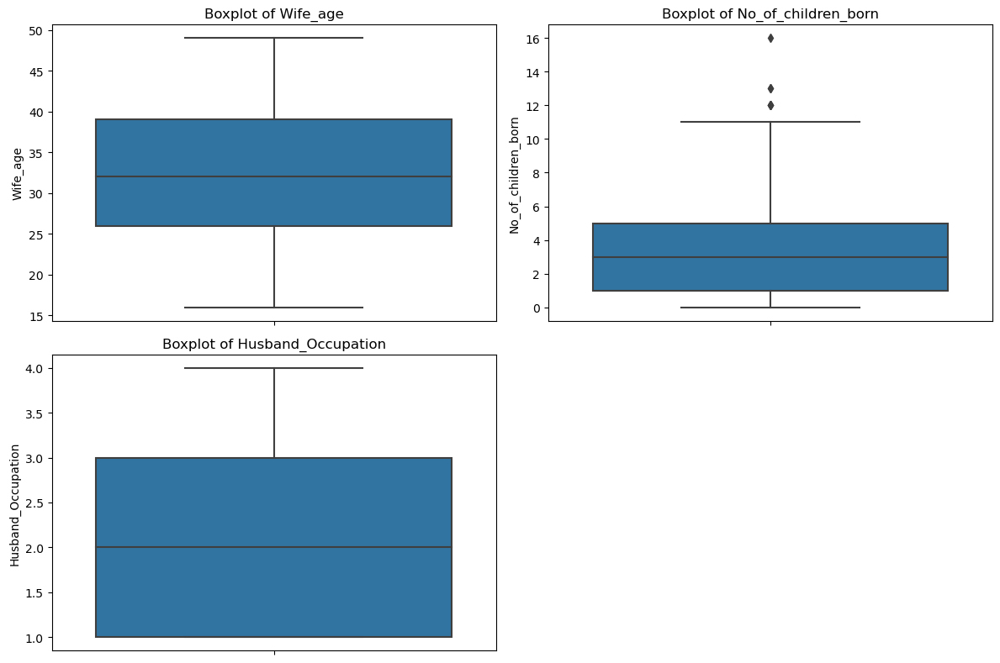

In [102]:
# Check the presence of outliers in the each features
plt.figure(figsize=(12,8))
feature_list= cmd_num.columns
for i in range(len(feature_list)): 
    plt.subplot(2, 2, i+1)
    sns.boxplot(y=cmd_num[feature_list[i]],data=cmd_num) 
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()# Define a function which results the upper and lower limit to detect outliersdef remove_outlier(col): Q1,Q3=col.quantile([0.25,0.75]) IQR=Q3-Q1 lower_range= Q1-(1.5 * IQR) upper_range= Q3+(1.5 * IQR) return lower_range, upper_range# Cap & floor the values beyond the outlier boundariesfor iin feature_list: LL,UL= remove_outlier(cmd_num[i]) cmd_num[i] = np.where(cmd_num[i] > UL,UL, cmd_num[i]) cmd_num[i] = np.where(cmd_num[i] < LL,LL, cmd_num[i])# Check the presence of outliers in the each featuresplt.figure(figsize=(12,8))feature_list= cmd_num.columns
    

## Insights :

In [103]:
# Define a function which results the upper and lower limit to detect outliers
def remove_outlier(col): 
    Q1,Q3=col.quantile([0.25,0.75]) 
    IQR=Q3-Q1 
    lower_range= Q1-(1.5 * IQR) 
    upper_range= Q3+(1.5 * IQR) 
    return lower_range, upper_range

In [104]:
# Cap & floor the values beyond the outlier boundaries
for i in feature_list: 
    LL,UL= remove_outlier(cmd_num[i]) 
    cmd_num[i] = np.where(cmd_num[i] > UL,UL, cmd_num[i]) 
    cmd_num[i] = np.where(cmd_num[i] < LL,LL, cmd_num[i])

C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\1557055997.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\1557055997.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


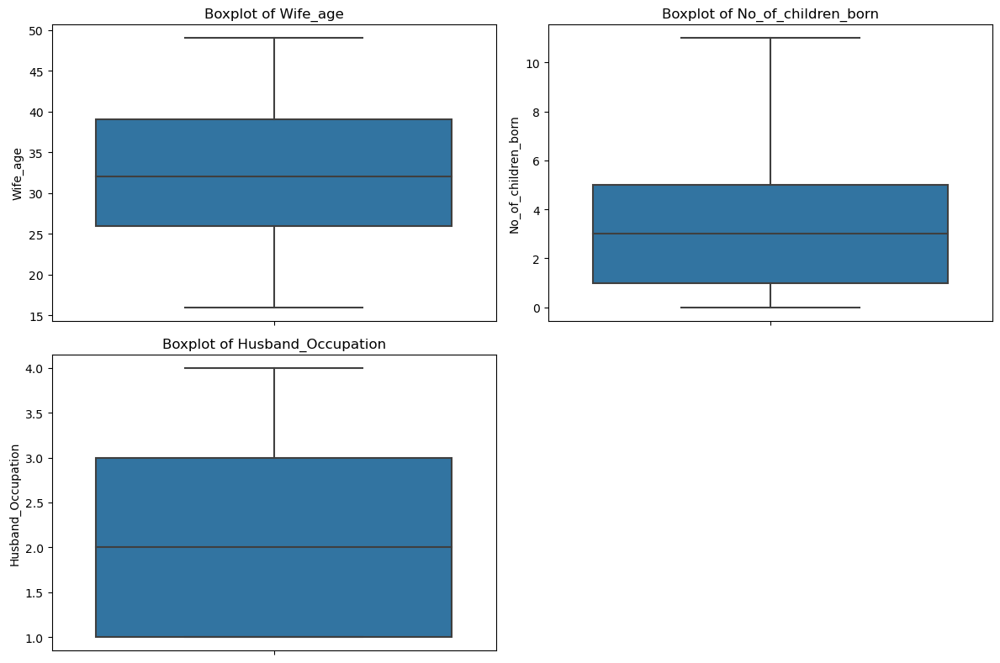

In [105]:
# Check the presence of outliers in the each features
plt.figure(figsize=(12,8))
feature_list= cmd_num.columns
for i in range(len(feature_list)):
    plt.subplot(2, 2, i+1) 
    sns.boxplot(y=cmd_num[feature_list[i]],data=cmd_num) 
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()

C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\336732087.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\336732087.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\336732087.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\336732087.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\336732087.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\336732087.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\336732087.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Loca

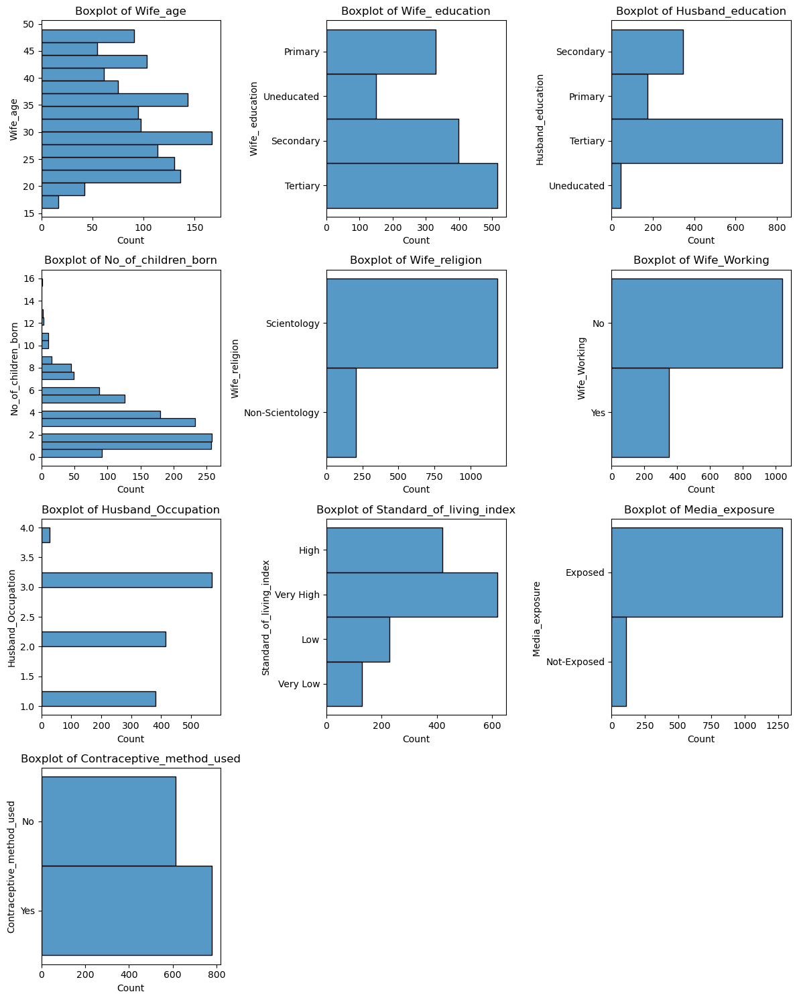

In [106]:
# Univariate Analysis
plt.figure(figsize=(12,15))
feature_list= cmd.columns
for i in range(len(feature_list)): 
    plt.subplot(4, 3, i+1) 
    sns.histplot(y=cmd[feature_list[i]],data=cmd) 
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()

C:\Users\Gagan\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1200x800 with 0 Axes>

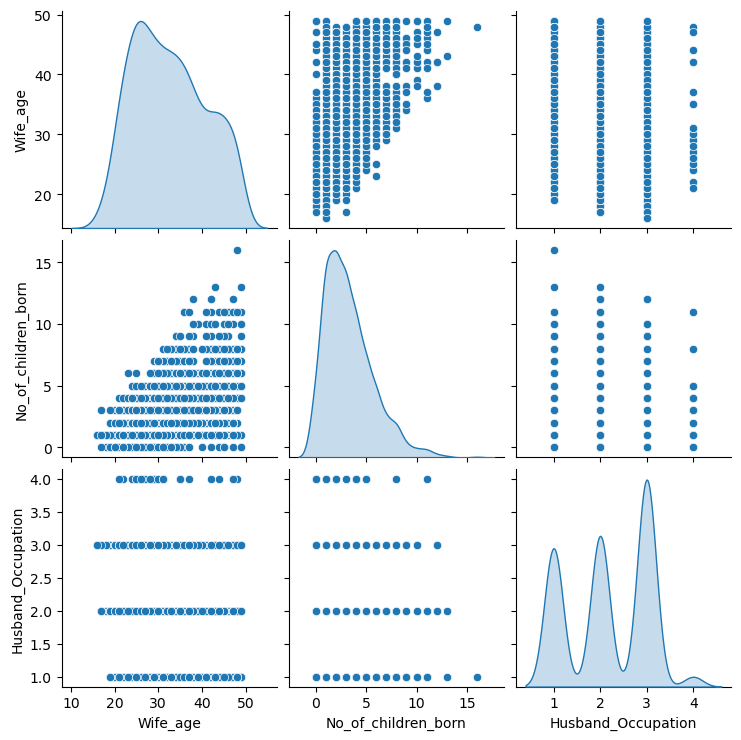

In [107]:
# Bivariate Analysis
plt.figure(figsize=(12,8))
sns.pairplot(cmd, diag_kind="kde")
plt.show()


## Checking for Correlations

In [108]:
numeric_cols = cmd.select_dtypes(include='number')
correlation_matrix = numeric_cols.corr()
correlation_matrix

,Wife_age,No_of_children_born,Husband_Occupation
Wife_age,1.000000,0.539520,-0.189798
No_of_children_born,0.539520,1.000000,-0.025032
Husband_Occupation,-0.189798,-0.025032,1.000000


## Multivariate Analysis

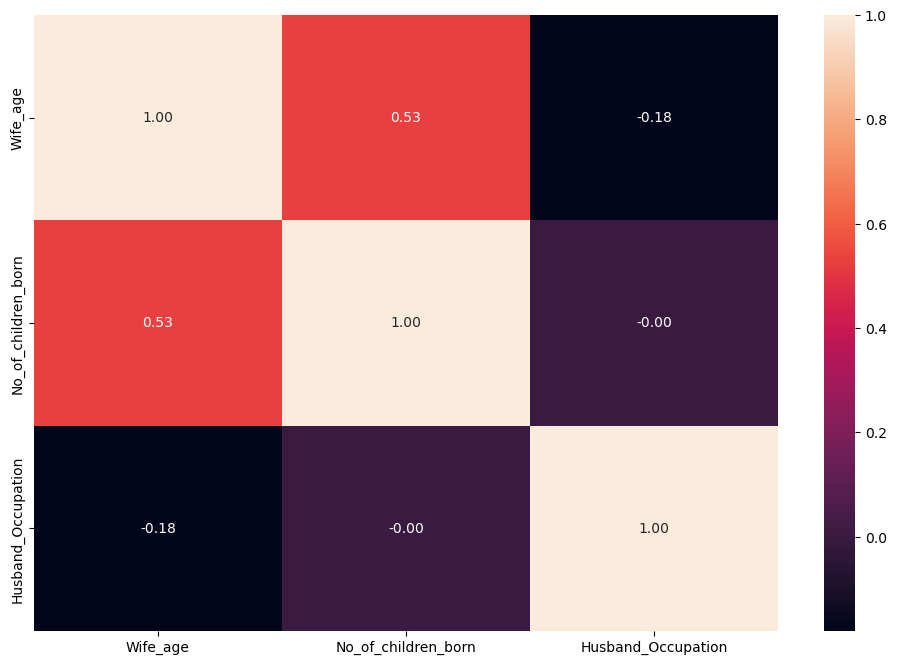

In [109]:
plt.figure(figsize=(12,8))
sns.heatmap(df.select_dtypes(include = 'number').corr(), annot = True, fmt = ".2f")
plt.show()

### Converting all objects to categorical codes

In [110]:
cmd['Wife_ education'] = np.where(cmd['Wife_ education'] == 'Uneducated', 1,cmd['Wife_ education'])
cmd['Wife_ education']= np.where(cmd['Wife_ education'] == 'Primary', 2,cmd['Wife_ education'])
cmd['Wife_ education']= np.where(cmd['Wife_ education'] == 'Secondary', 3,cmd['Wife_ education'])
cmd['Wife_ education']=np.where(cmd['Wife_ education'] == 'Tertiary', 4, cmd['Wife_ education'])

In [111]:
cmd['Husband_education'] = np.where(cmd['Husband_education'] == 'Uneducated', 1,cmd['Husband_education'])
cmd['Husband_education']= np.where(cmd['Husband_education'] == 'Primary', 2,cmd['Husband_education'])
cmd['Husband_education']= np.where(cmd['Husband_education'] == 'Secondary', 3,cmd['Husband_education'])
cmd['Husband_education']=np.where(cmd['Husband_education'] == 'Tertiary', 4, cmd['Husband_education'])

In [112]:
cmd.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,2,3,3.0,Scientology,No,2,High,Exposed,No
1,45.0,1,3,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,2,3,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,3,2,9.0,Scientology,No,3,High,Exposed,No
4,36.0,3,3,8.0,Scientology,No,3,Low,Exposed,No


In [113]:
cmd['Standard_of_living_index']=np.where(cmd['Standard_of_living_index'] =='Very High',1,cmd['Standard_of_living_index'])
cmd['Standard_of_living_index']=np.where(cmd['Standard_of_living_index'] =='Low',2,cmd['Standard_of_living_index'])
cmd['Standard_of_living_index']=np.where(cmd['Standard_of_living_index'] =='High',3,cmd['Standard_of_living_index'])
cmd['Standard_of_living_index']=np.where(cmd['Standard_of_living_index'] =='Very High',4,cmd['Standard_of_living_index'])

In [114]:
cmd['Wife_Working']=np.where(cmd['Wife_Working'] =='No', 0, cmd['Wife_Working'])
cmd['Wife_Working']=np.where(cmd['Wife_Working'] =='Yes', 1, cmd['Wife_Working'])

In [115]:
cmd['Contraceptive_method_used']=np.where(cmd['Contraceptive_method_used'] =='No',0,cmd['Contraceptive_method_used'])
cmd['Contraceptive_method_used']=np.where(cmd['Contraceptive_method_used'] =='Yes',1,cmd['Contraceptive_method_used'])           

In [116]:
cmd['Media_exposure ']=np.where(cmd['Media_exposure '] =='Not-Exposed', 0, cmd['Media_exposure '])
cmd['Media_exposure ']=np.where(cmd['Media_exposure '] =='Exposed', 1, cmd['Media_exposure '])

In [117]:
cmd['Wife_religion']=np.where(cmd['Wife_religion'] =='Non-Scientology', 0, cmd['Wife_religion'])
cmd['Wife_religion']=np.where(cmd['Wife_religion'] =='Scientology', 1, cmd['Wife_religion'])

In [118]:
# To view the top 5 record using head function of the dataset
cmd.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,2,3,3.0,1,0,2,3,1,0
1,45.0,1,3,10.0,1,0,3,1,1,0
2,43.0,2,3,7.0,1,0,3,1,1,0
3,42.0,3,2,9.0,1,0,3,3,1,0
4,36.0,3,3,8.0,1,0,3,2,1,0


In [119]:
# To view describe the dataset
cmd.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Wife_age,1326.0,NaN,NaN,NaN,32.557315,8.289259,16.0,26.0,32.0,39.0,49.0
Wife_ education,1393.0,4.0,4.0,515.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_education,1393.0,4.0,4.0,827.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_of_children_born,1372.0,NaN,NaN,NaN,3.290816,2.399697,0.0,1.0,3.0,5.0,16.0
Wife_religion,1393.0,2.0,1.0,1186.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,1393.0,2.0,0.0,1043.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_Occupation,1393.0,NaN,NaN,NaN,2.174444,0.854590,1.0,1.0,2.0,3.0,4.0
Standard_of_living_index,1393.0,4.0,1.0,618.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_exposure,1393.0,2.0,1.0,1284.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,1393.0,2.0,1.0,779.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [120]:
# To view info of the dataset
cmd.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1393 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1326 non-null   float64
 1   Wife_ education            1393 non-null   object 
 2   Husband_education          1393 non-null   object 
 3   No_of_children_born        1372 non-null   float64
 4   Wife_religion              1393 non-null   object 
 5   Wife_Working               1393 non-null   object 
 6   Husband_Occupation         1393 non-null   int64  
 7   Standard_of_living_index   1393 non-null   object 
 8   Media_exposure             1393 non-null   object 
 9   Contraceptive_method_used  1393 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 119.7+ KB


## convert the object into int8 datatype

In [121]:
for feature in cmd.columns: 
    if cmd[feature].dtype== 'object': 
        cmd[feature] = pd.Categorical(cmd[feature]).codes

In [122]:
# To view the dtype info
cmd.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1393 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1326 non-null   float64
 1   Wife_ education            1393 non-null   int8   
 2   Husband_education          1393 non-null   int8   
 3   No_of_children_born        1372 non-null   float64
 4   Wife_religion              1393 non-null   int8   
 5   Wife_Working               1393 non-null   int8   
 6   Husband_Occupation         1393 non-null   int64  
 7   Standard_of_living_index   1393 non-null   int8   
 8   Media_exposure             1393 non-null   int8   
 9   Contraceptive_method_used  1393 non-null   int8   
dtypes: float64(2), int64(1), int8(7)
memory usage: 53.1 KB


In [123]:
# convert the object into int8 datatype
for feature in cmd.columns: 
    if cmd[feature].dtype== 'object': 
        cmd[feature] = pd.Categorical(cmd[feature]).codes

# To view the dtype info

In [124]:
cmd.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1393 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1326 non-null   float64
 1   Wife_ education            1393 non-null   int8   
 2   Husband_education          1393 non-null   int8   
 3   No_of_children_born        1372 non-null   float64
 4   Wife_religion              1393 non-null   int8   
 5   Wife_Working               1393 non-null   int8   
 6   Husband_Occupation         1393 non-null   int64  
 7   Standard_of_living_index   1393 non-null   int8   
 8   Media_exposure             1393 non-null   int8   
 9   Contraceptive_method_used  1393 non-null   int8   
dtypes: float64(2), int64(1), int8(7)
memory usage: 53.1 KB


# Check the presence of outliers in the entire dataset

C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\4125668664.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\4125668664.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\4125668664.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\4125668664.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\4125668664.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\4125668664.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\4125668664.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppDa

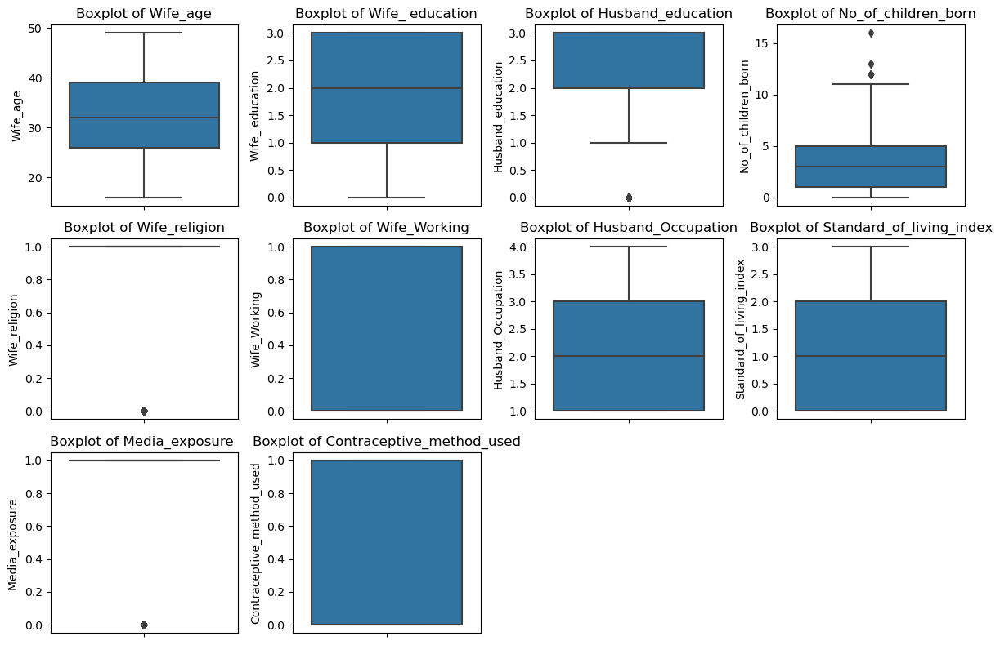

In [125]:
# Check the presence of outliers in the entire dataset
plt.figure(figsize=(12,8))
feature_list= cmd.columns
for i in range(len(feature_list)): 
    plt.subplot(3, 4, i+1) 
    sns.boxplot(y=cmd[feature_list[i]],data=cmd) 
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()

## Insights

In [126]:
# Define a function which results the upper and lower limit to detect outliers
def remove_outlier(col): 
    Q1,Q3=col.quantile([0.25,0.75]) 
    IQR=Q3-Q1 
    lower_range= Q1-(1.5 * IQR) 
    upper_range= Q3+(1.5 * IQR) 
    return lower_range, upper_range

## Cap & floor the values beyond the outlier boundaries

In [127]:
for i in feature_list: 
    LL,UL= remove_outlier(cmd[i]) 
    cmd[i] = np.where(cmd[i] > UL,UL, cmd[i]) 
    cmd[i] = np.where(cmd[i] < LL,LL, cmd[i])

# Check the presence of outliers in the each features

C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\1447633573.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\1447633573.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\1447633573.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\1447633573.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\1447633573.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\1447633573.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppData\Local\Temp\ipykernel_16928\1447633573.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Gagan\AppDa

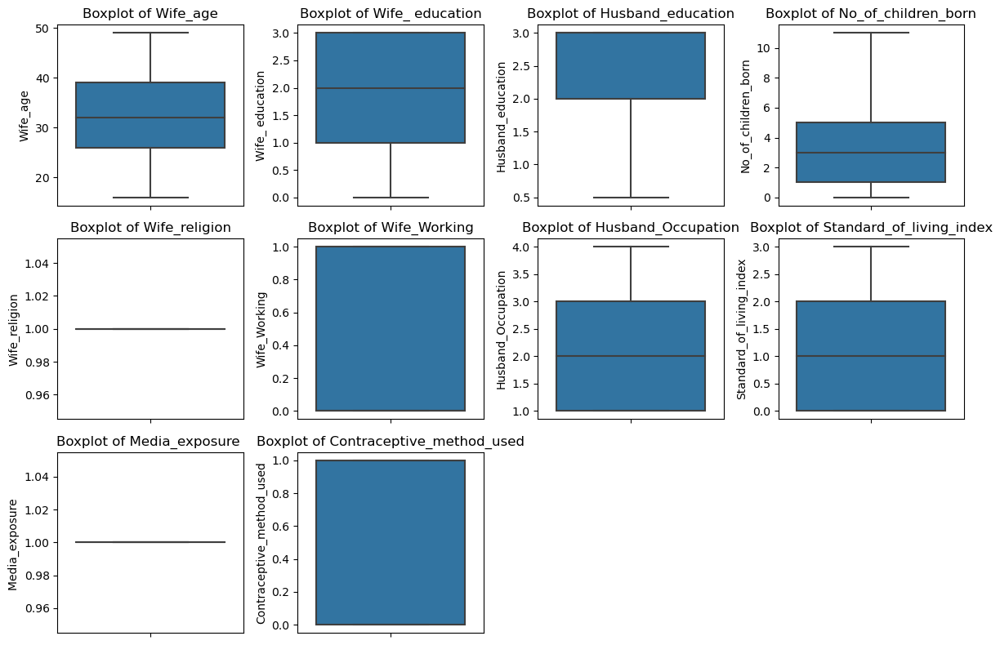

In [128]:
plt.figure(figsize=(12,8))
feature_list= cmd.columns
for i in range(len(feature_list)): 
    plt.subplot(3, 4, i+1) 
    sns.boxplot(y=cmd[feature_list[i]],data=cmd) 
    plt.title('Boxplot of {}'.format(feature_list[i])) 
    plt.tight_layout()

## Checking for Correlations

In [129]:
cmd.corr()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
Wife_age,1.000000,-0.058209,-0.054183,0.541569,NaN,0.032528,-0.189798,-0.156799,NaN,-0.097251
Wife_ education,-0.058209,1.000000,0.612967,-0.197466,NaN,0.058523,-0.370799,-0.269542,NaN,0.228341
Husband_education,-0.054183,0.612967,1.000000,-0.191812,NaN,-0.002612,-0.324801,-0.246578,NaN,0.141775
No_of_children_born,0.541569,-0.197466,-0.191812,1.000000,NaN,-0.103768,-0.022776,0.003592,NaN,0.121452
Wife_religion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,0.032528,0.058523,-0.002612,-0.103768,NaN,1.000000,-0.013669,-0.087576,NaN,-0.042433
Husband_Occupation,-0.189798,-0.370799,-0.324801,-0.022776,NaN,-0.013669,1.000000,0.228363,NaN,-0.040438
Standard_of_living_index,-0.156799,-0.269542,-0.246578,0.003592,NaN,-0.087576,0.228363,1.000000,NaN,-0.108264
Media_exposure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,-0.097251,0.228341,0.141775,0.121452,NaN,-0.042433,-0.040438,-0.108264,NaN,1.000000


# Check the Heatmap

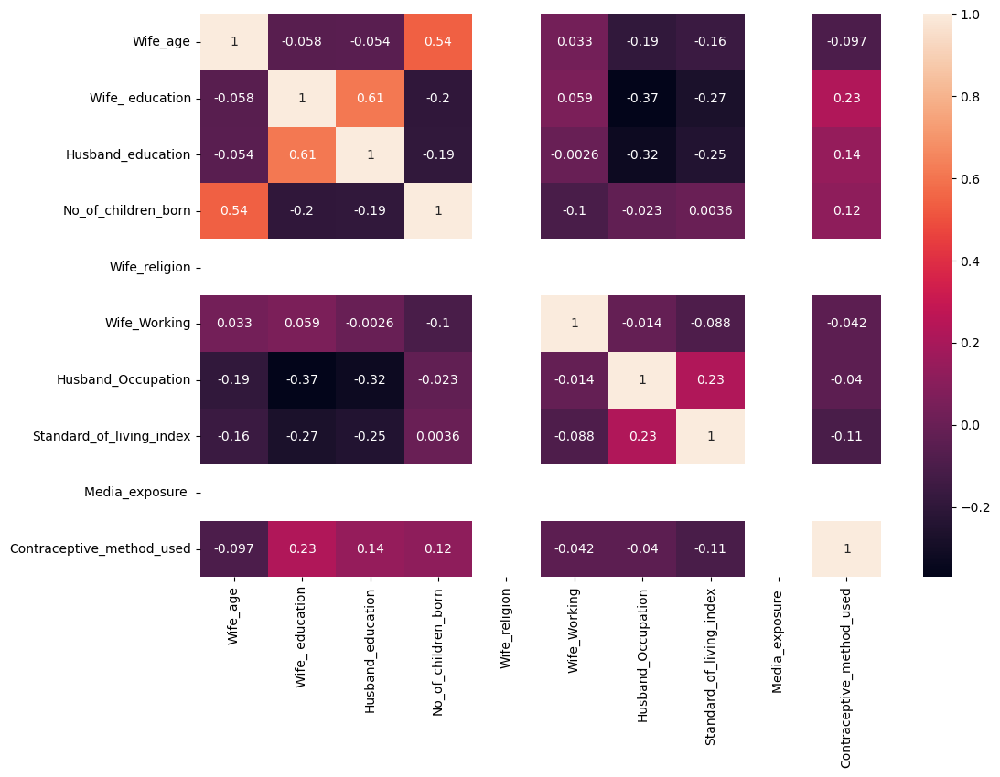

In [130]:
plt.figure(figsize=(12,8))
sns.heatmap(cmd.iloc[:, 0:10].corr(),annot=True)
plt.show()

# CART

In [291]:
# Creating a copy of the original data frame
cmd_1= cmd.copy()

## capture the target column ("Contraceptive_method_used") into separate vectors

In [292]:
X= cmd_1.drop("Contraceptive_method_used" , axis=1)
y= cmd_1.pop("Contraceptive_method_used")

# splitting data into training and test set for independent attributes

In [293]:
X_train, X_test, train_labels, test_labels = train_test_split(X, y, test_size=0.2, random_state=42)


# Import the decisiontreeclassifier library


In [294]:
from sklearn.tree import DecisionTreeClassifier

In [295]:
dt_model= DecisionTreeClassifier(criterion= 'gini' )

In [296]:
dt_model.fit(X_train, train_labels)

DecisionTreeClassifier()

In [297]:
# Import the tree library
from sklearn import tree

# Define the feature names
train_char_label = ['No', 'Yes']

# Open a file to write the DOT data
Credit_Tree_File = open('d:\Contraceptive_method.dot', 'w')

# Export the decision tree model to a .dot file
tree.export_graphviz(dt_model, out_file=Credit_Tree_File, feature_names=list(X_train),class_names=list(train_char_label))

# Close the file
Credit_Tree_File.close()

## Feature Importance
### importance of features in the tree building ( The importance of a feature is computed as the (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

In [298]:

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                               Imp
Wife_age                  0.351894
Wife_ education           0.094486
Husband_education         0.074767
No_of_children_born       0.249811
Wife_religion             0.000000
Wife_Working              0.037953
Husband_Occupation        0.075073
Standard_of_living_index  0.116016
Media_exposure            0.000000


In [299]:
y_predict= dt_model.predict(X_test)

## Regularising the Decision Tree

In [300]:
reg_dt_model = DecisionTreeClassifier(criterion = 'gini', max_depth = 7,min_samples_leaf=10,min_samples_split=30)
reg_dt_model.fit(X_train, train_labels)

DecisionTreeClassifier(max_depth=7, min_samples_leaf=10, min_samples_split=30)

In [301]:
credit_tree_regularized = open('d:\Contraceptive_method.dot','w')
dot_data = tree.export_graphviz(reg_dt_model, out_file= credit_tree_regularized , feature_names = list(X_train), class_names = list(train_char_label))

credit_tree_regularized.close()

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                               Imp
Wife_age                  0.351894
Wife_ education           0.094486
Husband_education         0.074767
No_of_children_born       0.249811
Wife_religion             0.000000
Wife_Working              0.037953
Husband_Occupation        0.075073
Standard_of_living_index  0.116016
Media_exposure            0.000000


In [302]:
ytrain_predict = reg_dt_model.predict(X_train)
ytest_predict = reg_dt_model.predict(X_test)

# AUC and ROC for the training data


AUC: 0.818


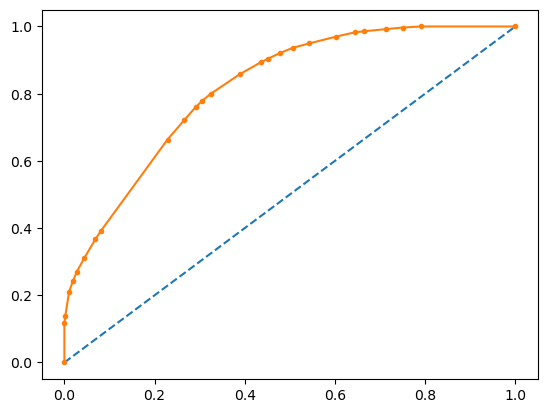

In [303]:
# predict probabilities
probs = reg_dt_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(train_labels, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(train_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

# AUC and ROC for the test data


AUC: 0.737


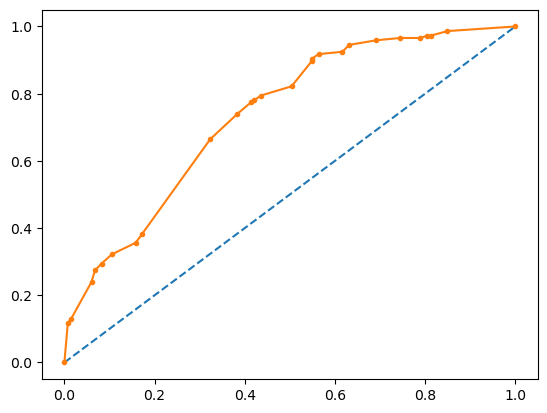

In [304]:
# predict probabilities
probs = reg_dt_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(test_labels, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(test_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

In [145]:
from sklearn.metrics import classification_report,confusion_matrix


### Classification report of train and test

In [146]:
print(classification_report(train_labels, ytrain_predict))


              precision    recall  f1-score   support

         0.0       0.77      0.61      0.68       481
         1.0       0.74      0.86      0.80       633

    accuracy                           0.75      1114
   macro avg       0.75      0.73      0.74      1114
weighted avg       0.75      0.75      0.75      1114



In [147]:
print(classification_report(test_labels, ytest_predict))


              precision    recall  f1-score   support

         0.0       0.72      0.50      0.59       133
         1.0       0.64      0.82      0.72       146

    accuracy                           0.67       279
   macro avg       0.68      0.66      0.65       279
weighted avg       0.68      0.67      0.66       279



### Confusion Matrix for the training data

In [177]:
pip install --upgrade scikit-learn


  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/79/3d/02d5d3ed359498fec3abdf65407d3c07e3b8765af17464969055aaec5171/scikit_learn-1.4.2-cp311-cp311-win_amd64.whl.metadata
   ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
   ---------------------------------------- 0.1/10.6 MB 1.8 MB/s eta 0:00:06
   ------ --------------------------------- 1.9/10.6 MB 16.9 MB/s eta 0:00:01
   -------------- ------------------------- 3.8/10.6 MB 24.1 MB/s eta 0:00:01
   ----------------- ---------------------- 4.7/10.6 MB 22.9 MB/s eta 0:00:01
   ----------------------- ---------------- 6.2/10.6 MB 21.0 MB/s eta 0:00:01
   --------------------------- ------------ 7.2/10.6 MB 21.8 MB/s eta 0:00:01
   ------------------------------ --------- 8.1/10.6 MB 20.6 MB/s eta 0:00:01
   --------------------------------- ------ 9.0/10.6 MB 20.6 MB/s eta 0:00:01
   ---------------

In [148]:
cm=confusion_matrix(train_labels, ytrain_predict)

In [149]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

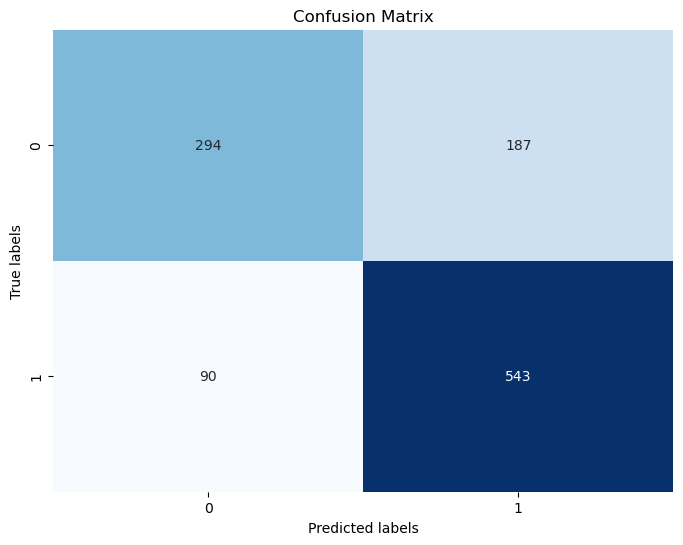

In [150]:
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

## Insight: The confusion matrix and classification report for training data





## Confusion Matrix for testing data

In [151]:
cm1=confusion_matrix(test_labels, ytest_predict)


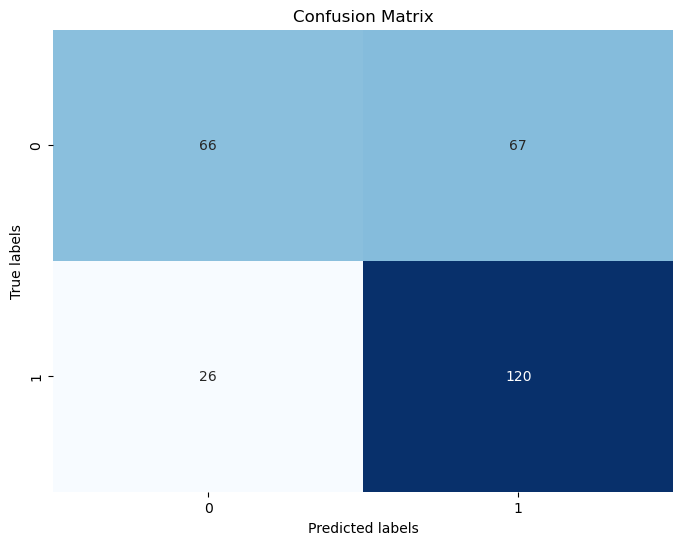

In [152]:
plt.figure(figsize=(8, 6))
sns.heatmap(cm1, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

## Insight: The confusion matrix and classification report for Test data

### Accuracy of the decision tree model on train data is 0.7271

In [153]:
reg_dt_model.score(X_train,train_labels)


0.751346499102334

### Accuracy of the decision tree model on test data is 0.6379

In [154]:
reg_dt_model.score(X_test,test_labels)


0.6666666666666666

# Logistics Regression

In [306]:
# Creating a copy of the original data frame
cmd_2= cmd.copy()

In [307]:
# Import the LabelEncoder library
from sklearn.preprocessing import LabelEncoder

In [308]:
# Defining a Label Encoder object instance
LE= LabelEncoder()
LE

LabelEncoder()

In [309]:
# Applying the created Label Encoder object for the target class
cmd['Contraceptive_method_used'] = LE.fit_transform(cmd['Contraceptive_method_used'])
cmd.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,1.0,2.0,3.0,1.0,0.0,2.0,2.0,1.0,0
1,45.0,0.0,2.0,10.0,1.0,0.0,3.0,0.0,1.0,0
2,43.0,1.0,2.0,7.0,1.0,0.0,3.0,0.0,1.0,0
3,42.0,2.0,1.0,9.0,1.0,0.0,3.0,2.0,1.0,0
4,36.0,2.0,2.0,8.0,1.0,0.0,3.0,1.0,1.0,0


In [310]:
cmd_2.isnull().sum()

Wife_age                     67
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

## Null value Treatment

In [311]:
# Importing necessary library
from sklearn.impute import SimpleImputer

# Define the imputer for numerical columns
numerical_imputer = SimpleImputer(strategy='median')

# List of numerical columns
numerical_cols = ['Wife_age', 'No_of_children_born']

# Impute numerical columns
cmd_2[numerical_cols] = numerical_imputer.fit_transform(cmd_2[numerical_cols])

# Display the first few rows of the DataFrame after imputation
cmd_2.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,1.0,2.0,3.0,1.0,0.0,2.0,2.0,1.0,0
1,45.0,0.0,2.0,10.0,1.0,0.0,3.0,0.0,1.0,0
2,43.0,1.0,2.0,7.0,1.0,0.0,3.0,0.0,1.0,0
3,42.0,2.0,1.0,9.0,1.0,0.0,3.0,2.0,1.0,0
4,36.0,2.0,2.0,8.0,1.0,0.0,3.0,1.0,1.0,0


### Converting the other 'object' type variables as dummy variables


In [312]:
cmd_dummy= pd.get_dummies(cmd_2,drop_first=True)
cmd_dummy.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,1.0,2.0,3.0,1.0,0.0,2.0,2.0,1.0,0
1,45.0,0.0,2.0,10.0,1.0,0.0,3.0,0.0,1.0,0
2,43.0,1.0,2.0,7.0,1.0,0.0,3.0,0.0,1.0,0
3,42.0,2.0,1.0,9.0,1.0,0.0,3.0,2.0,1.0,0
4,36.0,2.0,2.0,8.0,1.0,0.0,3.0,1.0,1.0,0


In [313]:
# Copy all the predictor variables into X dataframe
X= cmd_dummy.drop('Contraceptive_method_used', axis=1)

In [314]:
# copy target into the y dataframe.
y= cmd_dummy['Contraceptive_method_used']

In [315]:
# Split X and y into training and test sets in a 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1,stratify=cmd_dummy['Contraceptive_method_used'])

In [316]:
y_train.value_counts(1)

Contraceptive_method_used
1    0.558974
0    0.441026
Name: proportion, dtype: float64

In [317]:
y_test.value_counts(1)

Contraceptive_method_used
1    0.559809
0    0.440191
Name: proportion, dtype: float64

# Logistic Regression Model

In [74]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import roc_auc_score,roc_curve

In [318]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(solver='newton-cg', max_iter=10000, penalty='l2', C=1e10, verbose=True, n_jobs=2)

# Fit the model to the training data
model.fit(X_train, y_train)


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    1.2s finished


LogisticRegression(C=10000000000.0, max_iter=10000, n_jobs=2,
                   solver='newton-cg', verbose=True)

In [319]:
Ytrain_predict = model.predict(X_train)
Ytest_predict = model.predict(X_test)

In [320]:
ytest_predict_prob=model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.304510,0.695490
1,0.563891,0.436109
2,0.392231,0.607769
3,0.367412,0.632588
4,0.305900,0.694100


## Model Evaluation

In [321]:
# Accuracy - Training Data
model.score(X_train, y_train)

0.6594871794871795

## Accuracy comes out to be 0.6594871794871795

##  AUC Value closer to 1 tells that there is good seperatibility between the predicted classes and thus the model is good for prediction

## ROC Curve visually represents the above concept where the plot should be as far as possible from the diagnol.

## AUC and ROC for the training data


AUC: 0.712


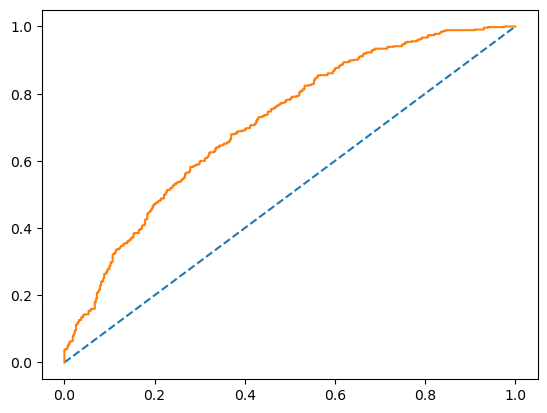

In [322]:
# predict probabilities
probs = model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

In [323]:
# Accuracy - Test Data
model.score(X_test, y_test)

0.638755980861244

## Accuracy of Test Data = 0.638755980861244


## AUC and ROC for the test data


AUC: 0.712


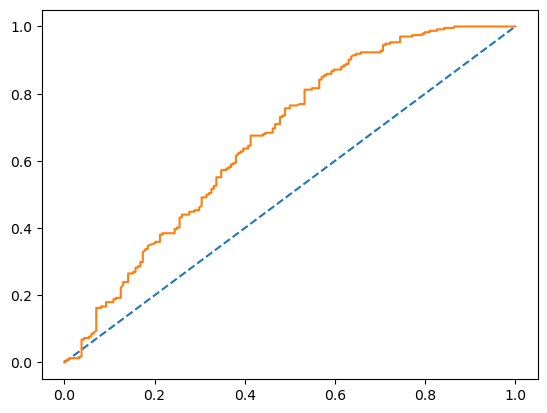

In [324]:
# predict probabilities
probs = model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

## Confusion Matrix for the training data


In [325]:
from sklearn.metrics import ConfusionMatrixDisplay

In [326]:
confusion_matrix(y_train, Ytrain_predict)

array([[219, 211],
       [121, 424]], dtype=int64)

In [327]:
cm = confusion_matrix(y_train, Ytrain_predict)
cm

array([[219, 211],
       [121, 424]], dtype=int64)

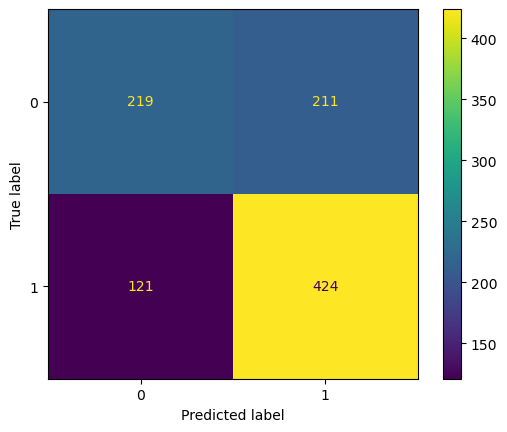

In [328]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

## Classification report

In [329]:
print(classification_report(y_train, Ytrain_predict))


              precision    recall  f1-score   support

           0       0.64      0.51      0.57       430
           1       0.67      0.78      0.72       545

    accuracy                           0.66       975
   macro avg       0.66      0.64      0.64       975
weighted avg       0.66      0.66      0.65       975



## Confusion Matrix for test data


In [330]:
confusion_matrix(y_test, Ytest_predict)


array([[ 86,  98],
       [ 53, 181]], dtype=int64)

In [331]:
cm = confusion_matrix(y_test, Ytest_predict)
cm

array([[ 86,  98],
       [ 53, 181]], dtype=int64)

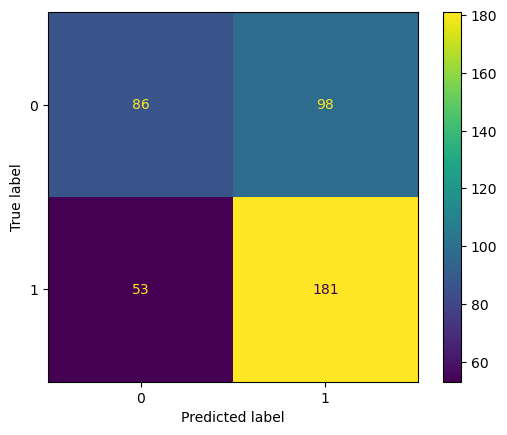

In [332]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [333]:
print(classification_report(y_test, Ytest_predict))

              precision    recall  f1-score   support

           0       0.62      0.47      0.53       184
           1       0.65      0.77      0.71       234

    accuracy                           0.64       418
   macro avg       0.63      0.62      0.62       418
weighted avg       0.64      0.64      0.63       418



## Applying GridSearchCV for Logistic Regression

In [334]:
grid={'penalty':['l2','none'],
      'solver':['sag','lbfgs'],
      'tol':[0.0001,0.00001]}

In [335]:
model = LogisticRegression(max_iter=10000,n_jobs=2)


In [336]:
grid_search = GridSearchCV(estimator = model, param_grid = grid, cv = 3,n_jobs=-1,scoring='f1')


In [337]:
grid_search.fit(X_train, y_train)


C:\Users\Gagan\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
12 fits failed out of a total of 24.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Gagan\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Gagan\anaconda3\Lib\site-packages\sklearn\base.py", line 1467, in wrapper
    estimator._validate_params()
  File "C:\Users\Gagan\anaconda3\Lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\Gagan\anaconda3\Lib\site-packages\s

GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=10000, n_jobs=2),
             n_jobs=-1,
             param_grid={'penalty': ['l2', 'none'], 'solver': ['sag', 'lbfgs'],
                         'tol': [0.0001, 1e-05]},
             scoring='f1')

In [338]:
print(grid_search.best_params_,'\n')
print(grid_search.best_estimator_)

{'penalty': 'l2', 'solver': 'sag', 'tol': 1e-05} 

LogisticRegression(max_iter=10000, n_jobs=2, solver='sag', tol=1e-05)


In [339]:
best_model= grid_search.best_estimator_

In [340]:
# Prediction on the training set

ytrain_predict = best_model.predict(X_train)
ytest_predict = best_model.predict(X_test)

In [341]:
## Getting the probabilities on the test set

ytest_predict_prob=best_model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.304829,0.695171
1,0.564242,0.435758
2,0.393028,0.606972
3,0.366988,0.633012
4,0.306586,0.693414


## Confusion matrix on the training data


In [342]:
cm = confusion_matrix(y_train, ytrain_predict)
cm

array([[219, 211],
       [121, 424]], dtype=int64)

              precision    recall  f1-score   support

           0       0.64      0.51      0.57       430
           1       0.67      0.78      0.72       545

    accuracy                           0.66       975
   macro avg       0.66      0.64      0.64       975
weighted avg       0.66      0.66      0.65       975
 



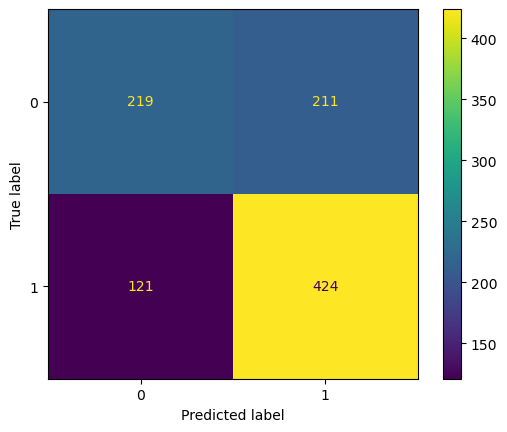

In [343]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()
print(classification_report(y_train, ytrain_predict),'\n');

## Summary

Evaluation of Logistic Regression Model

Analysis:
The logistic regression model demonstrates a relatively adept capability in forecasting contraceptive utilization (class 1), as evidenced by precision (0.67) and recall (0.78) metrics.
However, there exists an opportunity for enhancement in predicting instances of non-usage (class 0), as precision (0.64) and recall (0.51) scores for this category imply.
Comprehensive Report:
For the "No contraceptive" category (class 0):
Precision: 0.64
Recall: 0.51
F1-score: 0.57
For the "Contraceptive used" category (class 1):
Precision: 0.67
Recall: 0.78
F1-score: 0.72
The weighted average F1-score, amalgamating both classes, stands at 0.66, denoting the holistic effectiveness of the model.
With an overall accuracy of 0.66, the model demonstrates competence in forecasting across both categories.
Precision and recall metrics furnish valuable insights into the model's efficacy in precisely identifying instances of contraceptive usage. These metrics serve as pivotal indicators for a thorough assessment of the model's performance.

              precision    recall  f1-score   support

           0       0.62      0.47      0.53       184
           1       0.65      0.77      0.71       234

    accuracy                           0.64       418
   macro avg       0.63      0.62      0.62       418
weighted avg       0.64      0.64      0.63       418
 



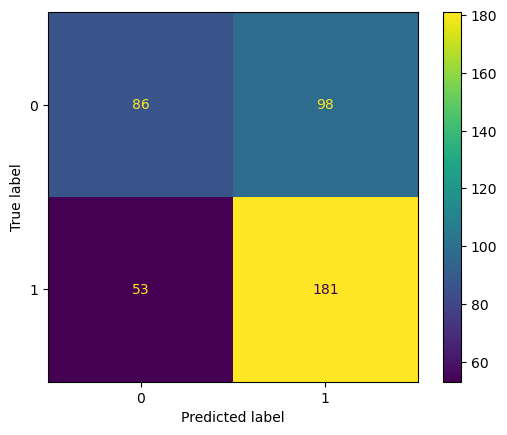

In [344]:
## Confusion matrix on the Test data
cm = confusion_matrix(y_test, ytest_predict)
cm
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()
print(classification_report(y_test, ytest_predict),'\n');

In [345]:
Specifty = (86/(86+99))

In [346]:
print(Specifty)

0.4648648648648649


In [347]:
from sklearn.metrics import confusion_matrix
tn, fp, fn, tp = confusion_matrix(y_test, ytest_predict).ravel()

In [348]:
tn,fp,fn,tp

(86, 98, 53, 181)

In [349]:
(tp+tn)/(tp+tn+fp+fn)# ACCURACY of predicting 0's and 1's correctly  

0.638755980861244

In [350]:
(tp+tn)/(tp+tn+fp+fn)# ACCURACY of predicting 0's and 1's correctly  

0.638755980861244

## Summary

## Linear Discriminant Analysis

In [247]:
# Creating a copy of the original data frame
cmd_3= cmd.copy()

In [248]:
cmd_3.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,1.0,2.0,3.0,1.0,0.0,2.0,2.0,1.0,0
1,45.0,0.0,2.0,10.0,1.0,0.0,3.0,0.0,1.0,0
2,43.0,1.0,2.0,7.0,1.0,0.0,3.0,0.0,1.0,0
3,42.0,2.0,1.0,9.0,1.0,0.0,3.0,2.0,1.0,0
4,36.0,2.0,2.0,8.0,1.0,0.0,3.0,1.0,1.0,0


## Null Value Treatment

In [251]:
# Define the imputer for numerical columns
numerical_imputer = SimpleImputer(strategy='median')

# List of numerical columns
numerical_cols = ['Wife_age', 'No_of_children_born']

# Impute numerical columns
cmd_3[numerical_cols] = numerical_imputer.fit_transform(cmd_2[numerical_cols])

# Display the first few rows of the DataFrame after imputation
cmd_3.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,1.0,2.0,3.0,1.0,0.0,2.0,2.0,1.0,0
1,45.0,0.0,2.0,10.0,1.0,0.0,3.0,0.0,1.0,0
2,43.0,1.0,2.0,7.0,1.0,0.0,3.0,0.0,1.0,0
3,42.0,2.0,1.0,9.0,1.0,0.0,3.0,2.0,1.0,0
4,36.0,2.0,2.0,8.0,1.0,0.0,3.0,1.0,1.0,0


In [252]:
# capture the target column ("Contraceptive_method_used") into separate vectors
X= cmd_3.drop("Contraceptive_method_used" , axis=1)
y= cmd_3.pop("Contraceptive_method_used")

In [253]:
# import the model_selection and metrics library file
from sklearn import metrics,model_selection

In [254]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [255]:
print('Number of rows and columns of the training set for the independent variables:', X_train.shape)

# Number of rows and columns of the training set for the dependent variable
print('Number of rows and columns of the training set for the dependent variable:', y_train.shape)

# Number of rows and columns of the test set for the independent variables
print('Number of rows and columns of the test set for the independent variables:', X_test.shape)

# Number of rows and columns of the test set for the dependent variable
print('Number of rows and columns of the test set for the dependent variable:', y_test.shape)

Number of rows and columns of the training set for the independent variables: (975, 9)
Number of rows and columns of the training set for the dependent variable: (975,)
Number of rows and columns of the test set for the independent variables: (418, 9)
Number of rows and columns of the test set for the dependent variable: (418,)


In [287]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [256]:
# Import the LinearDiscriminantAnalysis library file
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# LDA Model

In [257]:
#Build LDA Model
clf= LinearDiscriminantAnalysis()
model=clf.fit(X_train,y_train)
model

LinearDiscriminantAnalysis()

# Generate Coefficients and intercept for the Linear Discriminant Function

In [259]:
#intercept value
clf.intercept_

array([0.26013643])

## Intercept value is 0.2601

In [260]:
#coefficients for the Linear Discriminant Function
clf.coef_

array([[-7.26686167e-02,  5.18797397e-01,  1.98861282e-01,
         2.56295241e-01,  1.97044936e-15, -1.79831249e-01,
         1.52789903e-01, -1.89292026e-01,  0.00000000e+00]])

In [261]:
# To view the columns of X_train
X_train.columns

Index(['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure '],
      dtype='object')

# Linear Discriminant Function

= - 0.26013643 + (-7.26686167e-02 * 'Wife_age') + (5.18797397e-01 * 'Wife_ education') + (1.98861282e-01 * 'Husband_education') + 
         (2.56295241e-01 *'No_of_children_born') + ( 1.97044936e-15*'Wife_religion'+ (-1.79831249e-01*'Wife_Working'+
         (1.52789903e-01*'Husband_Occupation')+ (-1.89292026e-01*'Standard_of_living_index'+ ('Media_exposure '* 0.00000000e+00)

### rounded up coefficients


In [263]:
a=clf.coef_
np.round(a,2)

array([[-0.07,  0.52,  0.2 ,  0.26,  0.  , -0.18,  0.15, -0.19,  0.  ]])

# By the above equation and the coefficitents it is clear that, Observations -



# Prediction

In [265]:
## Training Data Class Prediction

In [266]:
pred_class_train = model.predict(X_train)

In [267]:
# Test Data Class Prediction
pred_class_test= model.predict(X_test)

# Training Data and Test Data Confusion Matric Comparison

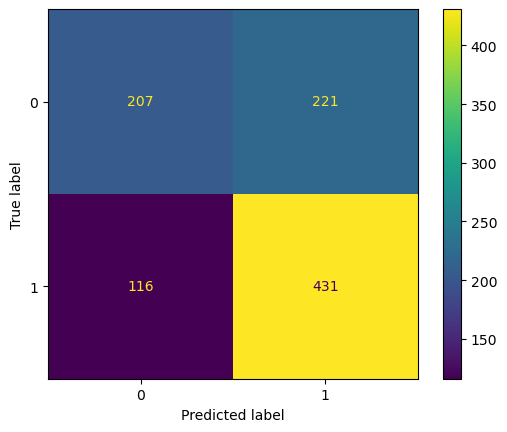

In [278]:
## Confusion matrix on the training data
cm = confusion_matrix(y_train, pred_class_train)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

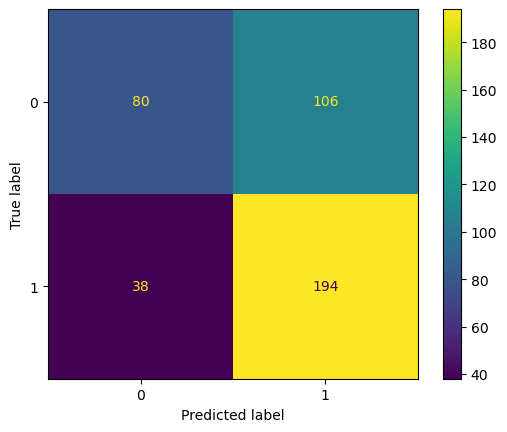

In [280]:
## Confusion matrix on the training data
cm = confusion_matrix(y_test, pred_class_test)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

## Training Data and Test Data Classification Report Comparison

In [282]:
print('Classification Report of the training data:\n\n',metrics.classification_report(y_train,pred_class_train),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(y_test,pred_class_test),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.64      0.48      0.55       428
           1       0.66      0.79      0.72       547

    accuracy                           0.65       975
   macro avg       0.65      0.64      0.64       975
weighted avg       0.65      0.65      0.65       975
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.68      0.43      0.53       186
           1       0.65      0.84      0.73       232

    accuracy                           0.66       418
   macro avg       0.66      0.63      0.63       418
weighted avg       0.66      0.66      0.64       418
 



# Summary : The confusion matrix and classification report for test data

Confusion Matrix:

The confusion matrix is a table with rows representing the actual classes and columns representing the predicted classes.
Each cell shows the number of instances that were predicted to belong to a particular class (column) but actually belonged to a different class (row).
In the image, the confusion matrix shows two classes (likely 0 and 1).
Out of 186 actual class 0 instances, 127 were correctly classified, and 59 were incorrectly classified as class 1 (shown in the top row).
Out of 232 actual class 1 instances, 151 were correctly classified, and 81 were incorrectly classified as class 0 (shown in the bottom row).
Classification Report:

The report provides a more detailed breakdown of the model's performance on each class.

Precision: This metric represents the proportion of predicted positive cases that were actually positive.

Class 0: Precision = 0.68 (meaning 68% of predicted class 0 were truly class 0).
Class 1: Precision = 0.65 (meaning 65% of predicted class 1 were truly class 1).
Recall: This metric represents the proportion of actual positive cases that were predicted positive.

Class 0: Recall = 0.43 (meaning the model only identified 43% of actual class 0 instances correctly).
Class 1: Recall = 0.84 (meaning the model correctly classified 84% of actual class 1 instances).
F1-Score: This metric is the harmonic mean of precision and recall, and it takes both precision and recall into account.

Class 0: F1-Score = 0.53
Class 1: F1-Score = 0.73
Accuracy: This metric represents the overall proportion of predictions that were correct.

Accuracy = 0.66 (meaning the model correctly classified 66% of the instances).
Overall Performance:

The model seems to have a slightly better performance in predicting class 1 (recall of 0.84) compared to class 0 (recall of 0.43). However, the precision for both classes is around 0.65, which means that there is a significant number of misclassified instances for both classes.

# Summary : The confusion matrix and classification report for training data

Overall Performance:

Accuracy: 65% - This means the model correctly classified 65% of the instances in the training data.
Class-wise Performance:

The report shows the performance for two classes (possibly positive and negative). Here's a breakdown for each class:

Class 0:

Precision: 0.64 - Out of all instances predicted as class 0, 64% were actually class 0. (Low false positives)
Recall: 0.48 - Out of all actual class 0 instances, the model only identified 48% correctly. (High false negatives)
F1-Score: 0.55 - This is a harmonic mean between precision and recall, indicating a moderate balance between the two metrics for class 0.
Class 1:

Precision: 0.66 - Similar to class 0, 66% of predicted class 1 instances were truly class 1.
Recall: 0.79 - The model performed better in identifying actual class 1 instances, correctly classifying 79% of them. (Low false negatives)
F1-Score: 0.72 - This indicates a better balance between precision and recall for class 1 compared to class 0.
Key Takeaways:

Similar to the test data, the model struggles with identifying class 0 instances, having a low recall (0.48). This means there might be a significant number of actual class 0 instances that were incorrectly classified as class 1 (false negatives) during training.
Class 1 has a higher recall (0.79), suggesting the model is better at identifying actual positives in this class during training.
Overall accuracy is moderate (0.65), which is typical for a training dataset.
Training vs Test Data Performance:

It's important to compare the model's performance on training and test data. In this case, both the training and test data have similar accuracy (around 65-66%). However, the model's recall for class 0 seems to be lower on the test data (0.43) compared to training data (0.48). This suggests that the model might be overfitting the training data to some extent.

## Probability prediction for the training and test data

In [284]:
# Training Data Probability Prediction
pred_prob_train= model.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test= model.predict_proba(X_test)

In [286]:
# Prediction of probability for train data
pred_prob_train[:,1]

array([0.5315517 , 0.38952506, 0.69286713, 0.58327292, 0.14563503,
       0.81566304, 0.44352753, 0.62262665, 0.71436959, 0.14094974,
       0.3700017 , 0.20528217, 0.75151882, 0.58749504, 0.33057091,
       0.77420103, 0.72757446, 0.707044  , 0.75283237, 0.57891589,
       0.46139431, 0.62443545, 0.64771244, 0.58668999, 0.67307932,
       0.80509963, 0.85889242, 0.50633801, 0.66642152, 0.54679076,
       0.61356152, 0.77221521, 0.88155922, 0.55389003, 0.43244332,
       0.65807807, 0.60024373, 0.79093456, 0.49353353, 0.35589469,
       0.43349865, 0.35671666, 0.4626679 , 0.71062766, 0.28203307,
       0.67757385, 0.36469292, 0.52569608, 0.74416011, 0.70132229,
       0.59314271, 0.5530575 , 0.55099915, 0.72675488, 0.8045251 ,
       0.20223583, 0.46650841, 0.75541202, 0.67547835, 0.79719029,
       0.48938602, 0.68847511, 0.41085524, 0.78061641, 0.24018917,
       0.45806664, 0.67126909, 0.63892843, 0.57489335, 0.6111075 ,
       0.51028252, 0.0809925 , 0.53645043, 0.6666422 , 0.58319

# AUC and ROC for the training data


AUC for the Training Data: 0.695
AUC for the Test Data: 0.686


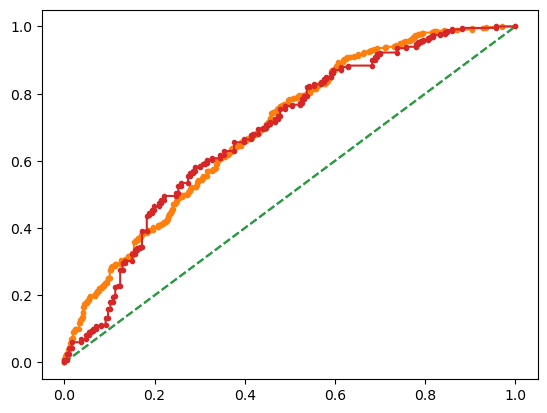

In [287]:
# AUC and ROC for the training data
# calculate AUC 
auc= metrics.roc_auc_score(y_train,pred_prob_train[:,1])
print('AUC for the Training Data: %.3f' % auc)
# calculate roc curve
fpr, tpr, thresholds= metrics.roc_curve(y_train,pred_prob_train[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label= 'Training Data')
# AUC and ROC for the test data
# calculate AUC 
auc= metrics.roc_auc_score(y_test,pred_prob_test[:,1])
print('AUC for the Test Data: %.3f' % auc)
# calculate roc curve
fpr, tpr, thresholds= metrics.roc_curve(y_test,pred_prob_test[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plotplt.legend(loc='best')
plt.show()
